<h1>Sommaire<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Prise-en-main-des-données." data-toc-modified-id="Prise-en-main-des-données.-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Prise en main des données.</a></span></li><li><span><a href="#Nettoyage-des-données." data-toc-modified-id="Nettoyage-des-données.-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Nettoyage des données.</a></span><ul class="toc-item"><li><span><a href="#Colonnes-inutiles-et-valeurs-manquantes." data-toc-modified-id="Colonnes-inutiles-et-valeurs-manquantes.-2.1"><span class="toc-item-num">2.1&nbsp;&nbsp;</span>Colonnes inutiles et valeurs manquantes.</a></span></li></ul></li><li><span><a href="#Analyse-textuelle." data-toc-modified-id="Analyse-textuelle.-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Analyse textuelle.</a></span><ul class="toc-item"><li><span><a href="#Tokenisation." data-toc-modified-id="Tokenisation.-3.1"><span class="toc-item-num">3.1&nbsp;&nbsp;</span>Tokenisation.</a></span></li><li><span><a href="#Fréquence-des-mots-du-corpus." data-toc-modified-id="Fréquence-des-mots-du-corpus.-3.2"><span class="toc-item-num">3.2&nbsp;&nbsp;</span>Fréquence des mots du corpus.</a></span></li><li><span><a href="#Bag-of-words." data-toc-modified-id="Bag-of-words.-3.3"><span class="toc-item-num">3.3&nbsp;&nbsp;</span>Bag of words.</a></span></li></ul></li><li><span><a href="#Suppression-des-tags-les-moins-courants." data-toc-modified-id="Suppression-des-tags-les-moins-courants.-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Suppression des tags les moins courants.</a></span><ul class="toc-item"><li><span><a href="#Tags-synonymes." data-toc-modified-id="Tags-synonymes.-4.1"><span class="toc-item-num">4.1&nbsp;&nbsp;</span>Tags synonymes.</a></span></li><li><span><a href="#Tags-les-plus-fréquents." data-toc-modified-id="Tags-les-plus-fréquents.-4.2"><span class="toc-item-num">4.2&nbsp;&nbsp;</span>Tags les plus fréquents.</a></span></li><li><span><a href="#Tags-présents-sur-plusieurs-années." data-toc-modified-id="Tags-présents-sur-plusieurs-années.-4.3"><span class="toc-item-num">4.3&nbsp;&nbsp;</span>Tags présents sur plusieurs années.</a></span></li></ul></li><li><span><a href="#Selection-de-colonnes-et-ajout-de-nouvelles-features." data-toc-modified-id="Selection-de-colonnes-et-ajout-de-nouvelles-features.-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>Selection de colonnes et ajout de nouvelles features.</a></span></li></ul></div>

# Notebook d'exploration

## Prise en main des données.

Commençons par importer les bibliothèques.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import nltk
from bs4 import BeautifulSoup
import xml
from sklearn.feature_extraction.text import TfidfVectorizer,TfidfTransformer,CountVectorizer
from sklearn.manifold import TSNE
from sklearn.decomposition import TruncatedSVD
from sklearn.cluster import DBSCAN,AgglomerativeClustering,SpectralClustering, AffinityPropagation
import re

In [2]:
nltk.download('punkt')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Niskiwork\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

Nous avons retenu la requête SQL suivante.

SELECT * FROM Posts Where CreationDate >='i' AND CreationDate <'i+1' AND ViewCount > 2000 AND PostTypeId =1 AND Score>10 AND AnswerCount >= 2 And FavoriteCount>=1

avec i indiquant l'année de création entre 2013 et aujourd'hui

In [3]:
query = pd.concat([pd.read_csv("QueryResults "+str(i)+".csv") for i in np.arange(2013,2020)],sort=True,ignore_index=True)

common_tags= pd.read_csv('common_tags.csv')
tagsynonyms=pd.read_csv("tagsynonyms.csv")

## Nettoyage des données.

### Colonnes inutiles et valeurs manquantes.

Supprimons des colonnes qui ne seront pas nécessaires.

In [4]:
query[query['CommunityOwnedDate'].notna()]

,AcceptedAnswerId,AnswerCount,Body,ClosedDate,CommentCount,CommunityOwnedDate,ContentLicense,CreationDate,DeletionDate,FavoriteCount,...,LastEditorDisplayName,LastEditorUserId,OwnerDisplayName,OwnerUserId,ParentId,PostTypeId,Score,Tags,Title,ViewCount
5603,18050072.0,20,<p>Everyone runs into syntax errors. Even expe...,NaN,17,2013-08-22 23:11:19,CC BY-SA 4.0,2013-08-05 03:11:15,NaN,259,...,NaN,250259.0,NaN,345031.0,NaN,1,698,<php><parsing><debugging><syntax-error>,PHP parse/syntax errors; and how to solve them,624877
6004,14178962.0,18,<p>I'm using the support library for my app. I...,NaN,13,2013-01-07 05:16:25,CC BY-SA 3.0,2013-01-06 00:00:24,NaN,40,...,NaN,1624366.0,NaN,1624366.0,NaN,1,137,<android><exception><android-asynctask><androi...,java.lang.IllegalStateException: Can not perfo...,159834
6610,17117688.0,6,<p>It is sad to see that science and math is n...,NaN,3,2013-06-18 05:30:52,CC BY-SA 4.0,2013-06-10 17:44:57,NaN,17,...,NaN,1783163.0,NaN,1919013.0,NaN,1,29,<javascript><android><math><mathjax><jqmath>,Display Good-looking Math Formula in Android,13995
6807,15000565.0,64,<p>I can't connect to my device anymore using ...,NaN,12,2014-01-10 08:07:56,CC BY-SA 3.0,2013-02-21 03:01:29,NaN,59,...,NaN,63550.0,NaN,461631.0,NaN,1,340,<android><adb><android-2.2-froyo>,"Android ADB device offline, can't issue commands",752100
6888,17805277.0,14,<p>I'm running an Express.js application using...,NaN,14,2013-07-22 11:56:37,CC BY-SA 4.0,2013-06-21 23:49:22,NaN,101,...,NaN,189687.0,NaN,971459.0,NaN,1,328,<node.js><sockets><tcp><express>,How do I debug error ECONNRESET in Node.js?,624364
7876,NaN,7,<p>I came across Xamarin claims that their Mon...,2018-01-21 22:21:41,23,2013-07-12 15:28:52,CC BY-SA 4.0,2013-06-16 14:52:36,NaN,157,...,NaN,4977870.0,NaN,1477347.0,NaN,1,555,<c#><java><android><xamarin><dot42>,Does anyone have benchmarks (code & results) c...,55136
10025,NaN,8,<p>I am developing an application that gets po...,NaN,5,2013-04-15 12:47:40,CC BY-SA 3.0,2013-04-01 16:45:52,NaN,21,...,NaN,1909996.0,NaN,1909996.0,NaN,1,42,<android><geolocation><gps><locationmanager><l...,LocationListener of NETWORK_PROVIDER is enable...,39056
10234,NaN,4,<p>Android's AccountManager appears to fetch t...,NaN,2,2013-01-23 04:03:43,CC BY-SA 3.0,2013-01-21 10:56:28,NaN,36,...,NaN,-1.0,NaN,1995666.0,NaN,1,61,<android><security><authentication><oauth><acc...,Shouldn't Android AccountManager Store OAuth T...,10443
12790,NaN,3,<p>I'm trying to put list of possible solution...,2014-10-15 14:33:48,12,2013-09-01 20:35:13,CC BY-SA 4.0,2013-08-30 18:38:58,NaN,355,...,NaN,3814319.0,NaN,1234445.0,NaN,1,368,<selenium><web-scraping><scrapy><phantomjs><ca...,Headless Browser and scraping - solutions,78888
13288,19326059.0,3,<p>I made one demo project (from Moving-MKAnno...,NaN,7,2013-10-22 17:18:53,CC BY-SA 3.0,2013-10-09 09:29:17,NaN,23,...,NaN,1468406.0,NaN,1468406.0,NaN,1,25,<iphone><ios><objective-c><mkmapview><mkannota...,Car (Annotation) animation (like uber app) not...,10865


In [5]:
query.drop(query[query['CommunityOwnedDate'].notna()].index,axis=0,inplace=True)

In [6]:
query.drop('CommunityOwnedDate',axis=1,inplace=True)

In [7]:
query.nunique()

AcceptedAnswerId         129120
AnswerCount                  69
Body                     167000
ClosedDate                 5695
CommentCount                 52
ContentLicense                2
CreationDate             166909
DeletionDate                  0
FavoriteCount               435
Id                       167000
LastActivityDate         166842
LastEditDate             110008
LastEditorDisplayName       736
LastEditorUserId          45544
OwnerDisplayName           1792
OwnerUserId              113859
ParentId                      0
PostTypeId                    1
Score                       867
Tags                     107779
Title                    166990
ViewCount                 78062
dtype: int64

In [8]:
query.count()

AcceptedAnswerId         129120
AnswerCount              167000
Body                     167000
ClosedDate                 5695
CommentCount             167000
ContentLicense           167000
CreationDate             167000
DeletionDate                  0
FavoriteCount            167000
Id                       167000
LastActivityDate         167000
LastEditDate             117347
LastEditorDisplayName      1643
LastEditorUserId         116129
OwnerDisplayName           2381
OwnerUserId              164752
ParentId                      0
PostTypeId               167000
Score                    167000
Tags                     167000
Title                    167000
ViewCount                167000
dtype: int64

On supprime les colonnes suivante car elles ne nous seront pas utiles.

In [9]:
query.drop(['PostTypeId','ParentId','DeletionDate','ContentLicense','OwnerDisplayName'],axis=1,inplace=True)

In [10]:
Min=common_tags.Count.min()
Max=common_tags.Count.max()
(np.round((np.log1p(common_tags.Count)-np.log1p(Min))/np.log1p(Max),decimals=1)*10).value_counts()

0.0    579
1.0    474
2.0    102
3.0     23
4.0      8
Name: Count, dtype: int64

In [11]:
for i in query.columns:
    print(i,query[i].hasnans)

AcceptedAnswerId True
AnswerCount False
Body False
ClosedDate True
CommentCount False
CreationDate False
FavoriteCount False
Id False
LastActivityDate False
LastEditDate True
LastEditorDisplayName True
LastEditorUserId True
OwnerUserId True
Score False
Tags False
Title False
ViewCount False


In [12]:
query.count()

AcceptedAnswerId         129120
AnswerCount              167000
Body                     167000
ClosedDate                 5695
CommentCount             167000
CreationDate             167000
FavoriteCount            167000
Id                       167000
LastActivityDate         167000
LastEditDate             117347
LastEditorDisplayName      1643
LastEditorUserId         116129
OwnerUserId              164752
Score                    167000
Tags                     167000
Title                    167000
ViewCount                167000
dtype: int64

Pour restreindre un peu plus le jeu de données on va se concentrer sur les questions qui ont des réponses acceptées (qui sont des "bonnes réponses").

In [13]:
query=query[query.AcceptedAnswerId.notna()]

In [14]:
query.count()

AcceptedAnswerId         129120
AnswerCount              129120
Body                     129120
ClosedDate                 4279
CommentCount             129120
CreationDate             129120
FavoriteCount            129120
Id                       129120
LastActivityDate         129120
LastEditDate              90953
LastEditorDisplayName      1259
LastEditorUserId          90024
OwnerUserId              127452
Score                    129120
Tags                     129120
Title                    129120
ViewCount                129120
dtype: int64

In [15]:
query=query[query.OwnerUserId.notna()]

In [16]:
query.count()

AcceptedAnswerId         127452
AnswerCount              127452
Body                     127452
ClosedDate                 4192
CommentCount             127452
CreationDate             127452
FavoriteCount            127452
Id                       127452
LastActivityDate         127452
LastEditDate              89756
LastEditorDisplayName       867
LastEditorUserId          89112
OwnerUserId              127452
Score                    127452
Tags                     127452
Title                    127452
ViewCount                127452
dtype: int64

On a maintenant 130000 entrées

Regardons la forme de la colonne "Tags"

In [17]:
query.Tags.loc[37687]

'<data-binding><properties><javafx>'

In [18]:
query.loc[1]

AcceptedAnswerId                                               1.67562e+07
AnswerCount                                                              4
Body                     <p>This must be simple, but as an only occasio...
ClosedDate                                                             NaN
CommentCount                                                             3
CreationDate                                           2013-05-26 04:12:23
FavoriteCount                                                            4
Id                                                                16756174
LastActivityDate                                       2021-02-07 17:10:31
LastEditDate                                                           NaN
LastEditorDisplayName                                                  NaN
LastEditorUserId                                                       NaN
OwnerUserId                                                         593975
Score                    

## Analyse textuelle.

### Tokenisation.

Dans les cellules suivante on va préparer des colonnes textuelles pour pouvoir les utiliser ensuite.

In [20]:
query['Body_text'] = query.Body.apply(lambda x: re.sub(r'[^a-zA-Z]',' ',BeautifulSoup(x, 'html.parser').get_text()))

In [21]:
query.Body_text[0]

'I have a project that uses a few other library projects  SlidingMenu  ActionbarSherlock  and both of these use the android support library  when building I am getting the following  UNEXPECTED TOP LEVEL EXCEPTION  java lang IllegalArgumentException  already added  Landroid support v  app LoaderManager      at com android dx dex file ClassDefsSection add ClassDefsSection java          at com android dx dex file DexFile add DexFile java          at com android dx command dexer Main processClass Main java          at com android dx command dexer Main processFileBytes Main java          at com android dx command dexer Main access     Main java         at com android dx command dexer Main   processFileBytes Main java          at com android dx cf direct ClassPathOpener processArchive ClassPathOpener java          at com android dx cf direct ClassPathOpener processOne ClassPathOpener java          at com android dx cf direct ClassPathOpener process ClassPathOpener java          at com andro

In [22]:
#query['first_paragraph_uncleaned'] = query.Body.apply(lambda x: BeautifulSoup(x, 'html.parser').p  )

In [23]:
help(re.sub)

Help on function sub in module re:

sub(pattern, repl, string, count=0, flags=0)
    Return the string obtained by replacing the leftmost
    non-overlapping occurrences of the pattern in string by the
    replacement repl.  repl can be either a string or a callable;
    if a string, backslash escapes in it are processed.  If it is
    a callable, it's passed the Match object and must return
    a replacement string to be used.



In [24]:
re.sub(r'[^a-zA-Z]',' ',query.Body_text[0])

'I have a project that uses a few other library projects  SlidingMenu  ActionbarSherlock  and both of these use the android support library  when building I am getting the following  UNEXPECTED TOP LEVEL EXCEPTION  java lang IllegalArgumentException  already added  Landroid support v  app LoaderManager      at com android dx dex file ClassDefsSection add ClassDefsSection java          at com android dx dex file DexFile add DexFile java          at com android dx command dexer Main processClass Main java          at com android dx command dexer Main processFileBytes Main java          at com android dx command dexer Main access     Main java         at com android dx command dexer Main   processFileBytes Main java          at com android dx cf direct ClassPathOpener processArchive ClassPathOpener java          at com android dx cf direct ClassPathOpener processOne ClassPathOpener java          at com android dx cf direct ClassPathOpener process ClassPathOpener java          at com andro

On regarde un exemple des phrases extraites.

In [25]:
' '.join([j for i in BeautifulSoup(query.loc[4].Body, 'html.parser').find_all('p')  for j in i.strings])

'In the example below,  #logo  is positioned absolutely and I need it to be horizontally centered within  #header . Normally, I would do a  margin:0 auto  for relatively positioned elements but I am stuck here. Can someone show me the way? JS Fiddle:  http://jsfiddle.net/DeTJH/ HTML CSS'

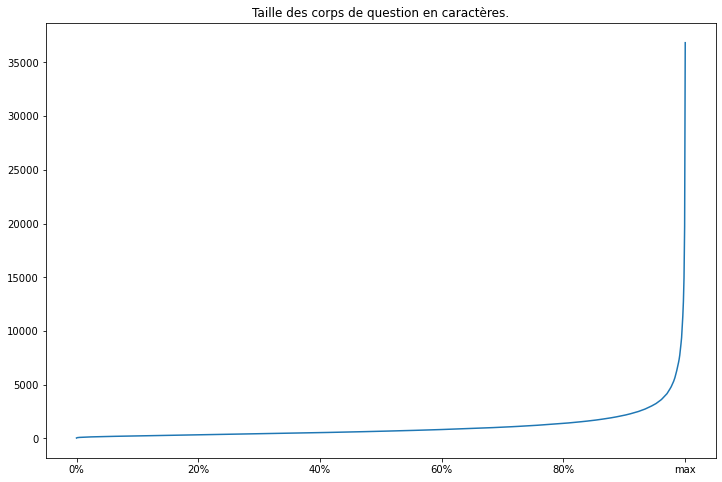

In [26]:
plt.figure(figsize=(12,8))
query['Body_text'].apply(len).describe(percentiles=np.arange(1000)/1000)[4:].plot()
plt.title('Taille des corps de question en caractères.')
plt.savefig(fname='Body_length_description.png',bbox_inches='tight')

plt.show()
plt.close()


<AxesSubplot:>

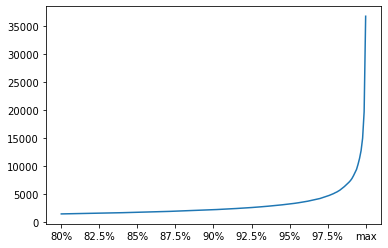

In [27]:
query['Body_text'].apply(len).describe(percentiles=np.arange(1000)/1000)[804:].plot()

<AxesSubplot:>

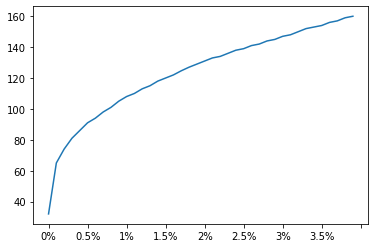

In [28]:
query['Body_text'].apply(len).describe(percentiles=np.arange(1000)/1000)[4:44].plot()

pour assurer une plus grande homogénéïté dans les données on filtre le jeu en fonction de la taille de texte du corps.

In [29]:
query=query[query.Body_text.apply(len)<=query.Body_text.apply(len).quantile(0.85)][query.Body_text.apply(len)>=query.Body_text.apply(len).quantile(0.01)]

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """Entry point for launching an IPython kernel.


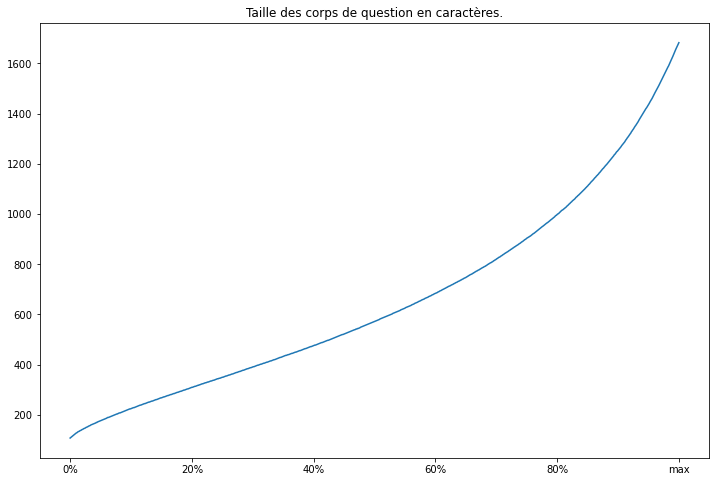

In [30]:
plt.figure(figsize=(12,8))
query['Body_text'].apply(len).describe(percentiles=np.arange(1000)/1000)[4:].plot()
plt.title('Taille des corps de question en caractères.')
plt.savefig(fname='Body_length_description_cleaned.png',bbox_inches='tight')

plt.show()
plt.close()

On tokenise les questions et leurs titres.

In [31]:
Toknzr=nltk.RegexpTokenizer(r'\w+')

In [32]:
query["Body_words"]=query.Body_text.apply(str).apply(str.lower).apply(Toknzr.tokenize)

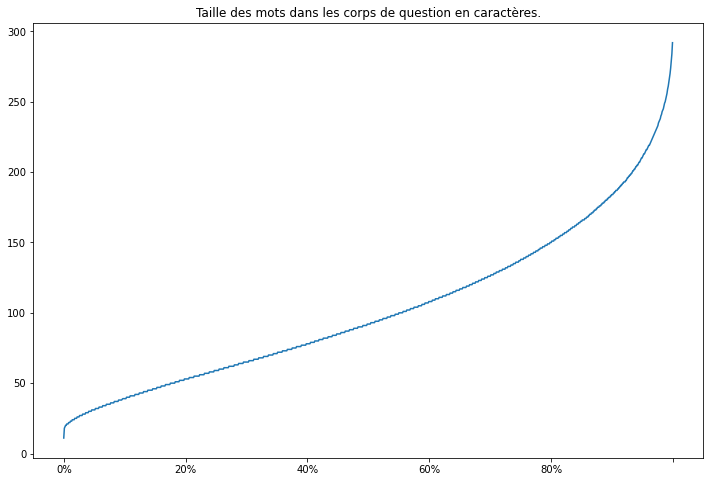

In [33]:
plt.figure(figsize=(12,8))
query.Body_words.apply(len).describe(percentiles=np.arange(1000)/1000.)[4:1004].plot()
plt.title('Taille des mots dans les corps de question en caractères.')
plt.savefig(fname='Body_words_length_description.png',bbox_inches='tight')

plt.show()
plt.close()


In [34]:
query.Body_words.apply(len).describe(percentiles=np.arange(20)/20.)

count    107070.000000
mean        102.936322
std          55.855641
min          11.000000
0%           11.000000
5%           31.000000
10%          39.000000
15%          46.000000
20%          53.000000
25%          59.000000
30%          65.000000
35%          71.000000
40%          78.000000
45%          85.000000
50%          92.000000
55%         100.000000
60%         108.000000
65%         117.000000
70%         126.000000
75%         138.000000
80%         150.000000
85%         165.000000
90%         184.000000
95%         211.000000
max         504.000000
Name: Body_words, dtype: float64

On applique le même traitement à la colonne titre.

In [35]:
query["Title_words"]=query.Title.apply(str).apply(str.lower).apply(Toknzr.tokenize)

In [36]:
query.Title_words.apply(len).describe(percentiles=np.arange(10)/10.)

count    107070.000000
mean          8.815616
std           3.329835
min           2.000000
0%            2.000000
10%           5.000000
20%           6.000000
30%           7.000000
40%           8.000000
50%           8.000000
60%           9.000000
70%          10.000000
80%          11.000000
90%          13.000000
max          51.000000
Name: Title_words, dtype: float64

<AxesSubplot:>

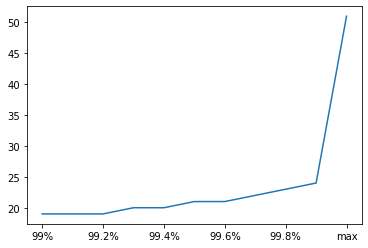

In [37]:
query.Title_words.apply(len).describe(percentiles=np.arange(1000)/1000.)[994:].plot()

<AxesSubplot:>

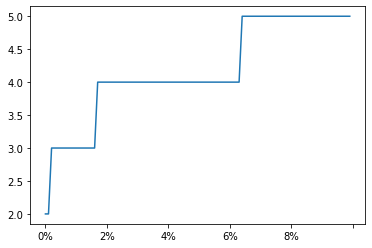

In [38]:
query.Title_words.apply(len).describe(percentiles=np.arange(1000)/1000.)[4:104].plot()

In [39]:
query[query.Title_words.apply(len)<3].Title

1289           UICollectionView scrollToItemAtIndexPath
1531      woocommerce get_woocommerce_currency_symbol()
2013                                   JavaScript CRC32
2819                               Laravel Repositories
3162                                  Negative infinity
                              ...                      
154772                           PyTorch - contiguous()
156892                                 DateTime Flutter
161032                Kafka INVALID_FETCH_SESSION_EPOCH
163094                            OpenGLRenderer: Davey
166480                  FragmentPagerAdapter deprecated
Name: Title, Length: 157, dtype: object

In [40]:
query.drop(query[query.Title_words.apply(len)<3].index,axis=0,inplace=True)

In [41]:
query.drop(query[query.Title_words.apply(len)>25].index,axis=0,inplace=True)

<AxesSubplot:>

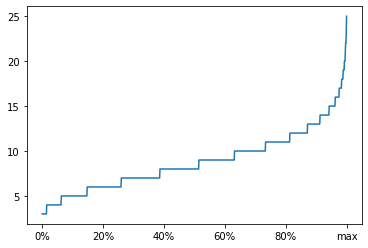

In [42]:
query.Title_words.apply(len).describe(percentiles=np.arange(1000)/1000.)[4:].plot()

On voit que certains titres sont la reproduction exact du message d'erreur et peuvent nous être utile même s'ils contiennent peu de mots.

Maintenant que l'on a tokenisé nos textes on va les décrire.

###  Fréquence des mots du corpus.

Commençons par regarder les mot les plus fréquents.

In [43]:
frequency=dict()
frequency={i:nltk.FreqDist(query.Body_words[i]) for i in query.index}

In [44]:
word_frequency_body=dict()
for idx in query.index:
    for key,value in frequency[idx].items():
        if key not in word_frequency_body.keys():
            word_frequency_body[key]=0
        word_frequency_body[key]+=value

On peut voir que l'on a une distribution très irrégulière des mots dans le corpus.

In [45]:
word_frequency_body=pd.Series(word_frequency_body)

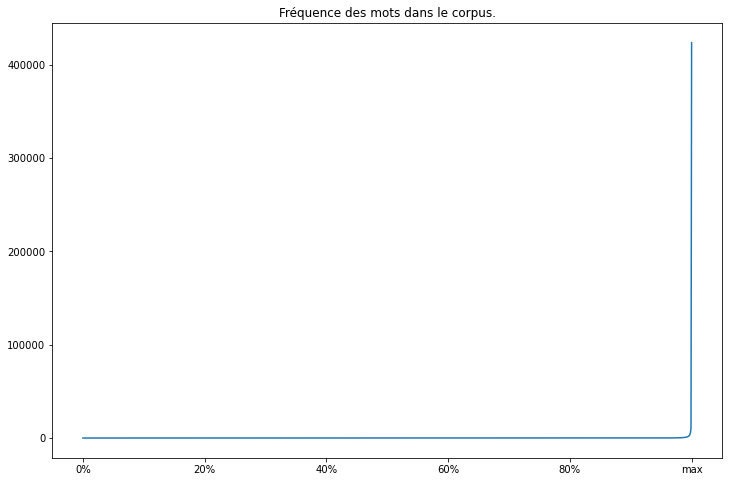

In [46]:
plt.figure(figsize=(12,8))

word_frequency_body.describe(percentiles=np.arange(1000)/1000.)[4:].plot()
plt.title('Fréquence des mots dans le corpus.')
plt.savefig(fname='word_frequency_description.png',bbox_inches='tight')

plt.show()
plt.close()


<AxesSubplot:>

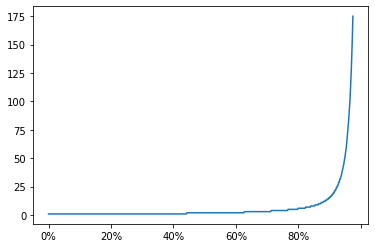

In [47]:
word_frequency_body.describe(percentiles=np.arange(1000)/1000.)[4:980].plot()

In [48]:
word_frequency_body=word_frequency_body.sort_values(ascending=False)

De nombreux mots sont des mots de la langue anglaise, d'autre sont certainement des relicat de notre extraction de l'html.

In [49]:
word_frequency_body[:50]

i           423810
the         417306
to          318594
a           230521
is          176544
in          158446
and         148316
this        134076
it          122266
of          109698
that         89220
for          83431
but          77821
my           77375
have         73578
with         67798
can          63080
not          61232
on           58703
t            55928
how          52135
if           51625
as           49576
be           48259
from         47672
do           46613
an           45261
using        44857
like         44301
m            44034
s            42314
am           41464
get          40539
when         39069
error        38857
there        38558
what         38141
or           37860
code         36208
file         36073
use          36035
so           36008
class        34878
want         34165
new          31626
data         31260
any          30386
name         30191
function     29668
are          28846
dtype: int64

On va maintenant nettoyer un peu les mots, on applique successivement un nettoyage par fréquence, puis les mots qui snt en fait des nombre et en fin les mots d'une seule lettre.

In [50]:
word_frequency_body=word_frequency_body[word_frequency_body>=50]

In [51]:
for i in word_frequency_body.index:
    try:
        int(i)
    except:
        None
    else:
        print("deleting", i,"whose frequency is", word_frequency_body[i])
        del word_frequency_body[i]

In [52]:
for i in word_frequency_body.index:
    if len(i)==1 and i !="c" and i!="r":
        print("deleting", i,"whose frequency is", word_frequency_body[i])
        del word_frequency_body[i]

deleting i whose frequency is 423810
deleting a whose frequency is 230521
deleting t whose frequency is 55928
deleting m whose frequency is 44034
deleting s whose frequency is 42314
deleting x whose frequency is 24270
deleting d whose frequency is 17841
deleting b whose frequency is 16951
deleting e whose frequency is 15128
deleting v whose frequency is 9603
deleting f whose frequency is 8956
deleting p whose frequency is 8669
deleting y whose frequency is 8317
deleting n whose frequency is 7905
deleting h whose frequency is 6333
deleting g whose frequency is 6227
deleting l whose frequency is 3490
deleting u whose frequency is 3262
deleting o whose frequency is 3109
deleting z whose frequency is 2935
deleting j whose frequency is 2524
deleting w whose frequency is 2522
deleting k whose frequency is 2501
deleting q whose frequency is 1843


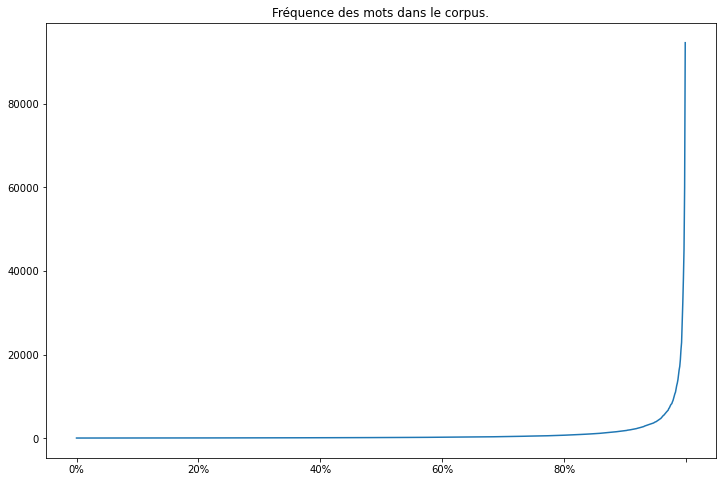

In [53]:
plt.figure(figsize=(12,8))
word_frequency_body.describe(percentiles=np.arange(1000)/1000.)[4:1004].plot()
plt.title('Fréquence des mots dans le corpus.')
plt.savefig(fname='word_frequency_precleaned_description.png',bbox_inches='tight')

plt.show()
plt.close()


In [54]:
word_frequency_body=word_frequency_body[word_frequency_body>10]

<AxesSubplot:>

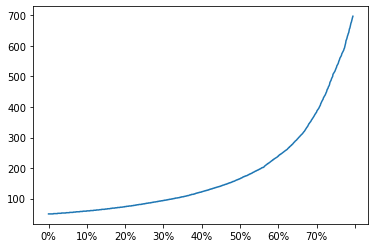

In [55]:
word_frequency_body.describe(percentiles=np.arange(1000)/1000.)[4:800].plot()

On voit que la nouvelle distribution est un peu plus lisse.

On va regarder la distribution des mot de longueur supérieur à 5 strictement.

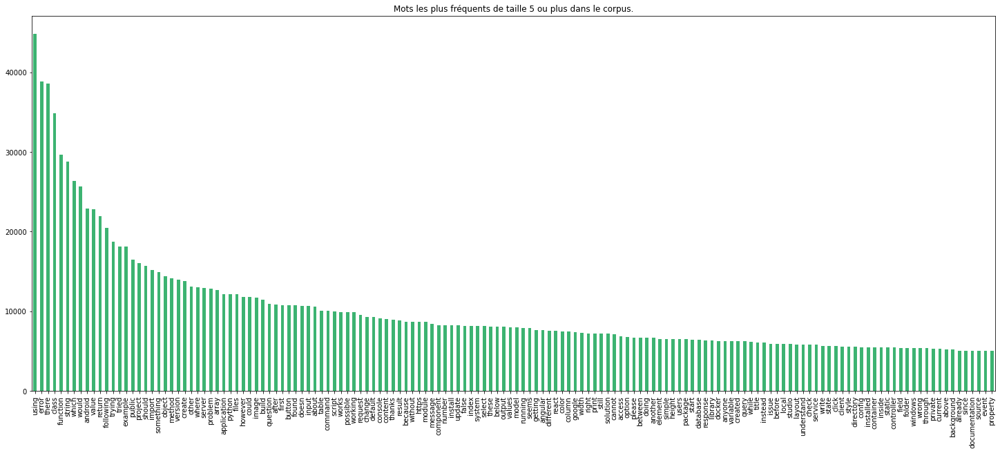

In [56]:
plt.figure(figsize=(25,10))
word_frequency_body[[i for i in word_frequency_body.index if len(i)>4 and word_frequency_body[i]>5000]].plot(kind='bar',color='mEdIuMSeaGreen', )
plt.title('Mots les plus fréquents de taille 5 ou plus dans le corpus.')
plt.savefig(fname='top_word_frequency_bar_chart.png',bbox_inches='tight')

plt.show()
plt.close()


On voit déjà que certain mots nous donne des informations précise sur le sujet de la question comme "python" par exemple alors que d'autre comme "String" sont très généraux en informatique.

On va maintenant regarder un peu plus en détail les tags fournit avec le jeu de données. On utilise une recherche par expressions régulières.

In [57]:
tags_extracted=query.Tags.str.extractall(r'<([^>^<]+)>')

In [58]:
query[['Tag_list'+str(j) for j in np.arange(len(tags_extracted.unstack()[0].columns)) ]]=tags_extracted.unstack()[0]

In [59]:
query[['Tag_list'+str(j) for j in np.arange(len(tags_extracted.unstack()[0].columns)) ]].value_counts()

Tag_list0   Tag_list1        Tag_list2        Tag_list3               Tag_list4        
javascript  jquery           html             css                     twitter-bootstrap    19
python      apache-spark     dataframe        pyspark                 apache-spark-sql     19
angular     typescript       ionic-framework  ionic2                  ionic3               16
android     android-studio   gradle           android-gradle-plugin   build.gradle         12
java        spring           jpa              spring-data             spring-data-jpa      12
                                                                                           ..
laravel     oauth-2.0        laravel-5.3      laravel-passport        scopes                1
            npm              assets           node-modules            selectize.js          1
            logging          laravel-5.1      error-logging           error-log             1
            laravel-routing  laravel-6        laravel-authenticati

On voit que nous avons des combinaisons intéressantes comme :

javascript  jquery          html             css                    twitter-bootstrap

In [60]:
for j in np.arange(len(tags_extracted.unstack()[0].columns)):
    print(query['Tag_list'+str(j)].value_counts())

python                  11925
javascript              11057
java                     7575
android                  7118
ios                      5634
                        ...  
drupal                      1
flux                        1
android-5.0-lollipop        1
soundcloud                  1
mdns                        1
Name: Tag_list0, Length: 2126, dtype: int64
swift              2105
css                1648
jquery             1548
pandas             1512
html               1240
                   ... 
liteide               1
system.drawing        1
cheerio               1
pinchzoom             1
code-generation       1
Name: Tag_list1, Length: 6508, dtype: int64
swift                727
dataframe            464
pandas               458
html                 449
twitter-bootstrap    379
                    ... 
uint                   1
dex-limit              1
stan                   1
c#-2.0                 1
treeset                1
Name: Tag_list2, Length: 9148, dtype: int64

On crée un dataframe avec les tags et leur fréquences.

In [61]:
tags_frequency= pd.Series(0,index={k  for i in ['Tag_list'+str(j) for j in np.arange(len(tags_extracted.unstack()[0].columns)) ] for k in query[i].unique() if k is not np.nan})
temp=pd.DataFrame()
for i in['Tag_list'+str(j) for j in np.arange(len(tags_extracted.unstack()[0].columns)) ]:
    temp[i]=query[i].value_counts().reindex(tags_frequency.keys())
tags_frequency=temp.fillna(0).transpose().apply(sum).sort_values(ascending=False)
del temp

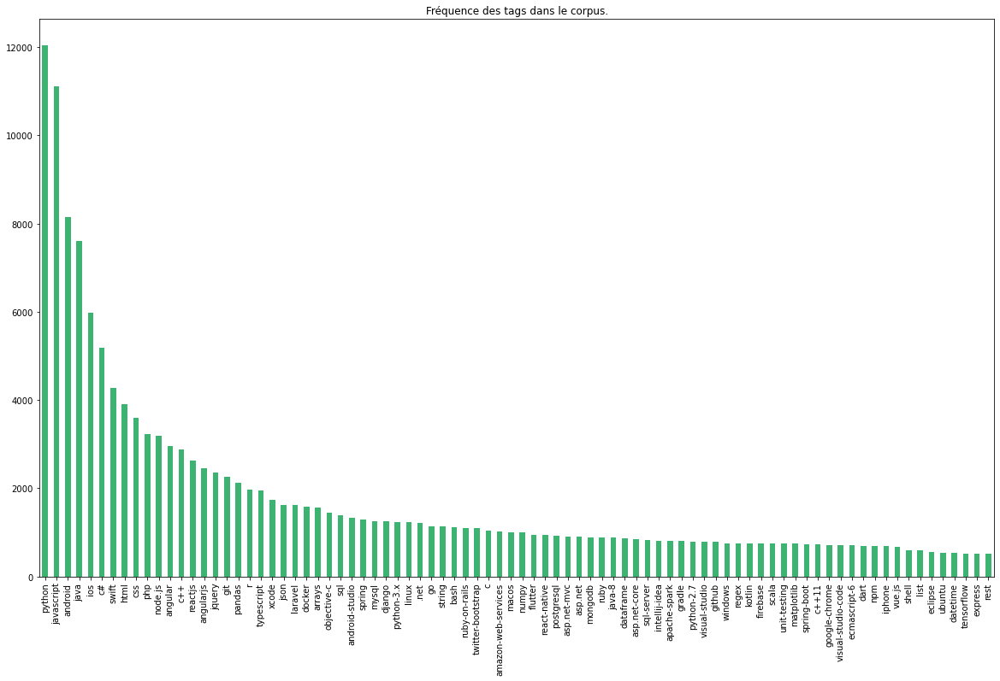

In [62]:
plt.figure(figsize=(20,12))
tags_frequency[tags_frequency >500].plot(kind='bar',color='mediumseagreen', )
plt.title('Fréquence des tags dans le corpus.')
plt.savefig(fname='top_tags_frequency_bar_chart.png',bbox_inches='tight')

plt.show()
plt.close()


On va retracer le graphique mais avec un sous-ensemble de tag tiré du jeu common_tags qui regroupe les tags les plus utilisé sur la plateforme.

In [63]:
tags_frequency_mf=tags_frequency[set(tags_frequency.index)&set(common_tags.TagName)].sort_values(ascending=False)

In [64]:
tags_frequency_mf

python                 12034.0
javascript             11118.0
android                 8149.0
java                    7606.0
ios                     5974.0
                        ...   
microsoft-graph-api        1.0
jpanel                     1.0
ibm-mobilefirst            1.0
struts2                    1.0
actionscript               1.0
Length: 1177, dtype: float64

<AxesSubplot:>

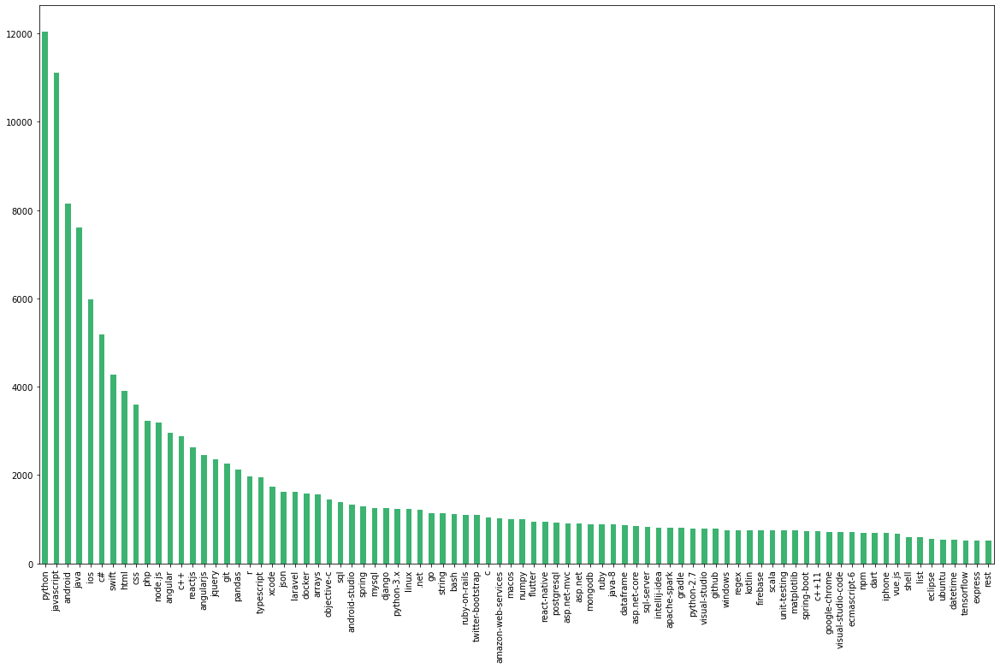

In [65]:
plt.figure(figsize=(20,12))
tags_frequency_mf[tags_frequency >500].plot(kind='bar',color='MediumSeaGreen', )

Pour indication les tags les plus fréquent dans le jeu common_tags:

<Figure size 2160x864 with 0 Axes>

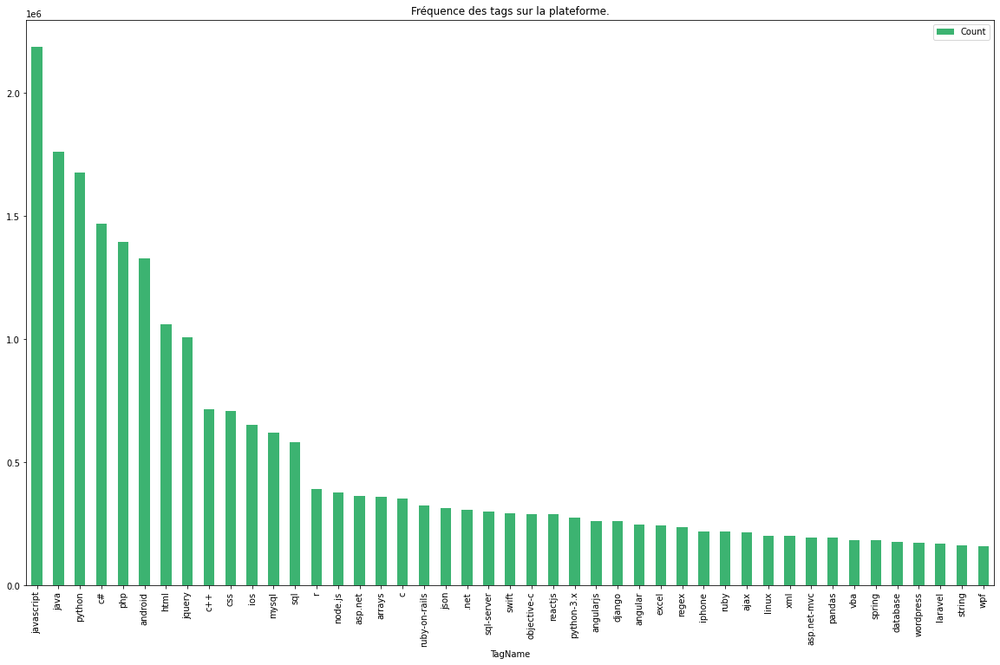

In [66]:
plt.figure(figsize=(30,12))
common_tags.sort_values(ascending=False,by='Count').loc[common_tags.Count>150000,['TagName','Count']].plot(kind='bar',color='mEdIuMSeaGreen',x='TagName',y='Count',figsize=(20,12))
plt.title('Fréquence des tags sur la plateforme.')
plt.savefig(fname='most_common_tags_frequency_bar_chart.png',bbox_inches='tight')
plt.show()
plt.close()

In [67]:
common_tags=common_tags.sort_values(ascending=False,by='Count')

On va comparer la fréquence des tags extraits de notre jeu de questions sur la plateforme avec le jeu de donnée qui correspond aux tags les plus utilisés généralement (la fréquence correspond alors au décompte fournit par StackOverflow).

No handles with labels found to put in legend.
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  if __name__ == '__main__':


<Figure size 2880x864 with 0 Axes>

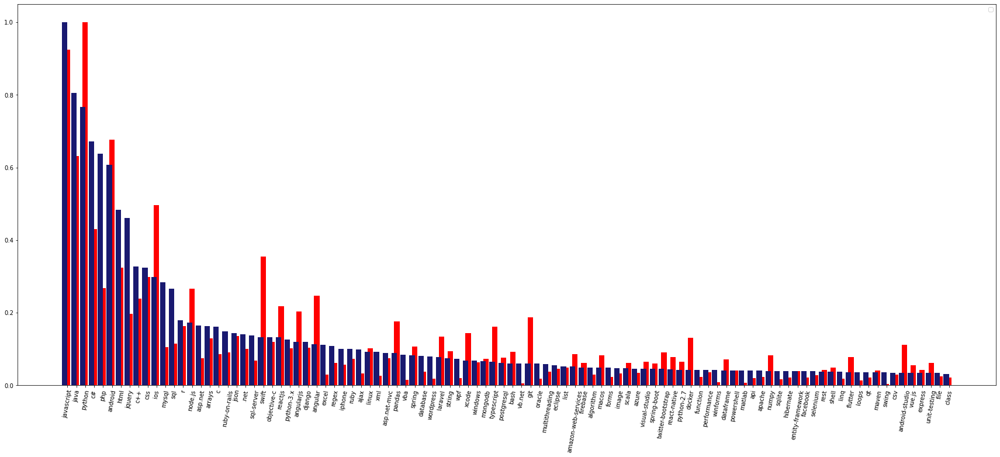

In [68]:
plt.figure(figsize=(40,12))
fig, ax=plt.subplots(figsize=(30,12))
ax.bar(x=np.arange(100),height=tags_frequency_mf[common_tags.TagName[:100]]/tags_frequency_mf.max(),width=0.6,color='red')
ax.bar(x=np.arange(100),height=common_tags.Count[:100]/common_tags.Count.max(),width=-0.6,align='edge',color='midnightblue',alpha=1)
ax.set_xticks(np.arange(100))
ax.set_xticklabels(common_tags.TagName[:100],rotation=80)
ax.legend()

fig.show()

Pour avoir une meilleure idée de la forme générale d'un tag, on utilise une table de correspondance fournit par la plateforme pour réunir des synonymes de tags ensembles.

In [69]:
tagsynonyms=pd.read_csv("tagsynonyms.csv")

In [70]:
map_dict=dict()
for i in set(tags_frequency.index)&set(tagsynonyms['SourceTagName']):
    map_dict[i]=tagsynonyms[tagsynonyms.SourceTagName == i].TargetTagName.values[0]

In [71]:
for i in tags_frequency.index:
    if i in map_dict.keys():
        if map_dict[i] not in tags_frequency.index:
            tags_frequency[map_dict[i]]=0
        tags_frequency[map_dict[i]]=tags_frequency[i]+tags_frequency[map_dict[i]]
        del tags_frequency[i]
common_tags.TagName=common_tags.TagName.replace(map_dict)

In [72]:
tags_frequency_mf=tags_frequency[set(tags_frequency.index)&set(common_tags.TagName)].sort_values(ascending=False)

No handles with labels found to put in legend.
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:8: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  


<Figure size 2880x864 with 0 Axes>

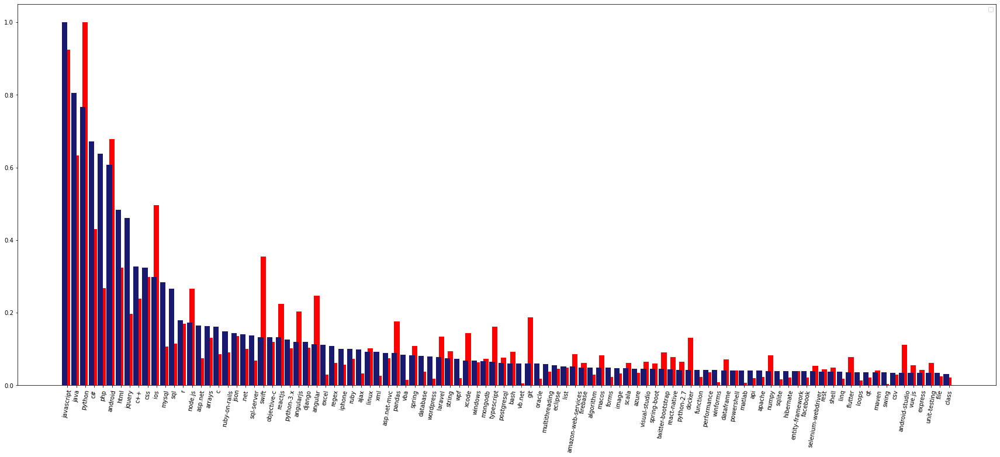

In [73]:
plt.figure(figsize=(40,12))
fig, ax=plt.subplots(figsize=(30,12))
ax.bar(x=np.arange(100),height=tags_frequency_mf[common_tags.TagName[:100]]/tags_frequency_mf.max(),width=0.6,color='red')
ax.bar(x=np.arange(100),height=common_tags.Count[:100]/common_tags.Count.max(),width=-0.6,align='edge',color='midnightblue',alpha=1)
ax.set_xticks(np.arange(100))
ax.set_xticklabels(common_tags.TagName[:100],rotation=80)
ax.legend()
fig.show()

On trace maintenant le même graphique en s'appuyant sur la part relative des tags. (les deux graphique ci-dessus étaient simplement normalisé par le maximum des occurence).

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:10: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  # Remove the CWD from sys.path while we load stuff.


<Figure size 2880x864 with 0 Axes>

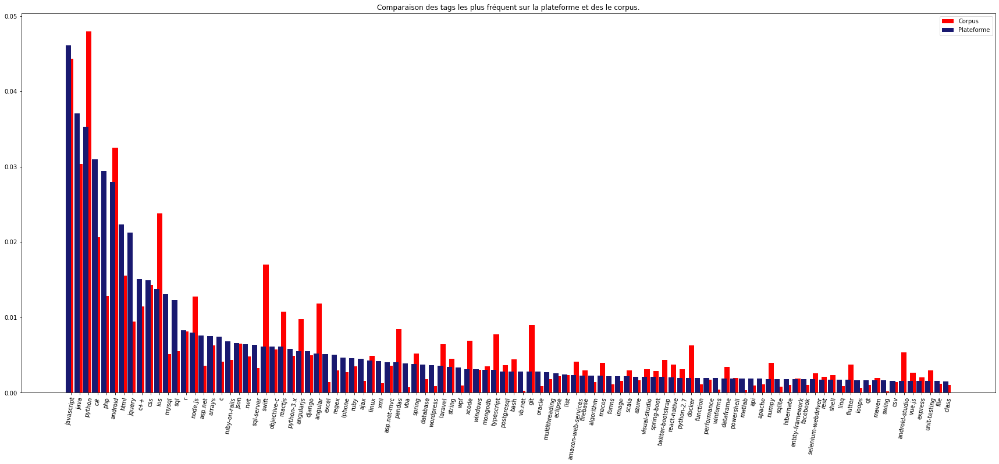

In [74]:
plt.figure(figsize=(40,12))
fig, ax=plt.subplots(figsize=(30,12))
ax.bar(x=np.arange(100),height=tags_frequency_mf[common_tags.TagName[:100]]/tags_frequency_mf.sum(),width=0.6,color='red')
ax.bar(x=np.arange(100),height=common_tags.Count[:100]/common_tags.Count.sum(),width=-0.6,align='edge',color='midnightblue',alpha=1)
ax.set_xticks(np.arange(100))
ax.set_xticklabels(common_tags.TagName[:100],rotation=80)
ax.legend(['Corpus','Plateforme'])
plt.title('Comparaison des tags les plus fréquent sur la plateforme et des le corpus.')
plt.savefig(fname='comparison_most_common_tags_and_corpus.png',bbox_inches='tight')
fig.show()

### Bag of words.

On va utiliser une vectorisation et un algorithme de manifold learning pour visualiser nos données.

On regarde la repartition en bigrams et trigrams que l'on stocke pour une utilisation ultérieure, et on va calculer les fréquence TfIdf des textes.

In [75]:
query['Body_Bigrams']=query.Body_words.apply(nltk.ngrams,**{'n':2}).apply(list)
query['Body_Trigrams']=query.Body_words.apply(nltk.ngrams,**{'n':3}).apply(list)

In [76]:
tfidf=TfidfVectorizer(max_features=65000,ngram_range=(1,3),stop_words='english')

On va regarder la similarité des mots entre les différents tag, pour cela on va regrouper les différents texte par tags. Cela va nous permettre d'établir un vocabulaire propre à chaque tag. La manière dont on l'implémente permet à l'un de nos texte (question posé) d'être présent dans le corpus de plusieurs tag et donc d'établir un vocabulaire plus proche entre par exemple "python" et "pip" qu'entre "python" et "java".

<AxesSubplot:>

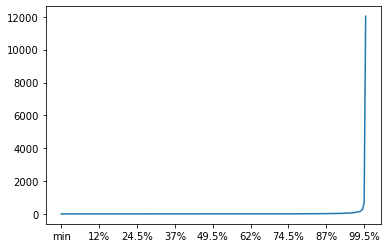

In [77]:
tags_frequency.describe(percentiles=np.arange(200)/200.)[3:].plot()

In [78]:
tags_frequency.describe(percentiles=np.arange(1000)/1000.)[950:]

94.6%       53.738
94.7%       55.000
94.8%       56.000
94.9%       57.000
95%         59.000
95.1%       60.000
95.2%       61.656
95.3%       63.000
95.4%       64.000
95.5%       66.000
95.6%       68.000
95.7%       69.921
95.8%       72.000
95.9%       73.000
96%         76.000
96.1%       77.000
96.2%       80.000
96.3%       83.000
96.4%       85.000
96.5%       89.000
96.6%       91.000
96.7%       94.000
96.8%       97.000
96.9%      100.000
97%        104.000
97.1%      107.000
97.2%      110.000
97.3%      115.000
97.4%      117.000
97.5%      121.000
97.6%      126.000
97.7%      130.000
97.8%      135.000
97.9%      141.000
98%        146.000
98.1%      160.000
98.2%      164.246
98.3%      172.899
98.4%      181.552
98.5%      196.000
98.6%      209.000
98.7%      229.000
98.8%      250.164
98.9%      264.000
99%        283.470
99.1%      312.000
99.2%      354.776
99.3%      396.145
99.4%      494.246
99.5%      695.470
99.6%      781.716
99.7%      932.123
99.8%     12

In [79]:
for i in tags_frequency[tags_frequency>=50].index:
    print(i)

python
javascript
android
java
ios
c#
swift
html
css
php
node.js
angular
c++
reactjs
angularjs
jquery
git
pandas
r
typescript
xcode
json
laravel
docker
arrays
objective-c
sql
android-studio
spring
mysql
django
python-3.x
linux
.net
go
string
bash
ruby-on-rails
twitter-bootstrap
c
amazon-web-services
macos
numpy
flutter
react-native
postgresql
asp.net-mvc
asp.net
mongodb
ruby
java-8
dataframe
asp.net-core
sql-server
intellij-idea
apache-spark
gradle
python-2.7
visual-studio
github
windows
regex
kotlin
firebase
scala
unit-testing
matplotlib
spring-boot
c++11
google-chrome
visual-studio-code
ecmascript-6
dart
npm
iphone
vue.js
shell
list
eclipse
ubuntu
datetime
tensorflow
express
rest
maven
dictionary
date
laravel-5
powershell
entity-framework
jenkins
http
multithreading
database
.net-core
webpack
performance
azure
lambda
image
spring-mvc
ajax
kubernetes
twitter-bootstrap-3
flask
machine-learning
asp.net-web-api
visual-studio-2015
amazon-s3
java-stream
opencv
uitableview
ios7
excel
androi

In [80]:
len(tags_frequency[tags_frequency>=350].index)

121

On voit que plusieurs tag se recoupe encore comme par exemple python et python-3.x on va tenter de créer des synonyme supplémentaire.

In [81]:
tagsynonyms2=pd.DataFrame(columns=['tag1','tag2'])
k=0
tag1=[]
tag2=[]
for j in tags_frequency.index:
    if len(j)>=4:
        for i in tags_frequency.index:
            if'+' not in j and j!=i :
                if len(j)>=4:
                    if bool(re.search('^'+j+r'[\.\-0-9]+$',i))and i[-2:]!='js' or bool(re.search('^'+j+r'[\.\-0-9]+$',i[:-1])):
                        tag1.append(i)
                        tag2.append(j)
                        k+=1
                        print(k,i,j)
tagsynonyms2.tag1=tag1
tagsynonyms2.tag2=tag2

1 python-3.x python
2 python-2.7 python
3 python-3.5 python
4 python-3.4 python
5 python-3.6 python
6 python-2.x python
7 python-3.3 python
8 python-3.7 python
9 python-2.6 python
10 python-3.8 python
11 python-2.4 python
12 python-3.9 python
13 javascript-1.7 javascript
14 android-10.0 android
15 android-11 android
16 java-8 java
17 java-9 java
18 java-7 java
19 java-11 java
20 java-10 java
21 java-12 java
22 java-6 java
23 java-14 java
24 java-15 java
25 java-13 java
26 java-16 java
27 java-2d java
28 java-5 java
29 swift3 swift
30 swift2 swift
31 swift4 swift
32 swift5 swift
33 swift4.2 swift
34 swift4.1 swift
35 swift4.1.5 swift
36 html4 html
37 angular6 angular
38 angular5 angular
39 angular7 angular
40 angular8 angular
41 angular9 angular
42 angular10 angular
43 angularjs-1.6 angularjs
44 angularjs-1.5 angularjs
45 jquery-1.9 jquery
46 jquery-3 jquery
47 jquery-1.7 jquery
48 typescript2.0 typescript
49 typescript1.8 typescript
50 typescript1.5 typescript
51 typescript1.4 typescri

336 asp.net-mvc-5.1 asp.net-mvc-5
337 asp.net-mvc-5.2 asp.net-mvc-5
338 javafx-8 javafx
339 javafx-2 javafx
340 javafx-11 javafx
341 xcode7.3 xcode7
342 xcode7.1 xcode7
343 xcode7.2 xcode7
344 retrofit2 retrofit
345 asp.net-identity-2 asp.net-identity
346 asp.net-identity-3 asp.net-identity
347 phpstorm-2016.1 phpstorm
348 rx-java2 rx-java
349 ios9.1 ios9
350 ios9.3.2 ios9
351 ios9.2 ios9
352 spring-security4 spring-security
353 font-awesome-5 font-awesome
354 font-awesome-3.2 font-awesome
355 font-awesome-4 font-awesome
356 ruby-on-rails-3.2 ruby-on-rails-3
357 ruby-on-rails-3.1 ruby-on-rails-3
358 math.h math
359 swagger-2.0 swagger
360 msbuild-15 msbuild
361 rspec2 rspec
362 rspec3 rspec
363 safari8 safari
364 xcode5.1 xcode5
365 xcode5.0.1 xcode5
366 centos7 centos
367 centos6 centos
368 centos6.5 centos
369 sublimetext3 sublimetext
370 sublimetext2 sublimetext
371 ios10.3 ios10
372 ios10.2 ios10
373 socket.io-1.0 socket.io
374 chart.js2 chart.js
375 google-analytics-4 google-analy

673 beyondcompare3 beyondcompare
674 uint8t uint
675 uint32 uint
676 uint64 uint
677 uint32-t uint
678 geoip2 geoip
679 typo3-6.2.x typo3
680 typo3-4.5 typo3
681 typo3-9.x typo3
682 directx-11 directx
683 opencart2.x opencart
684 httplib2 httplib
685 moto-360 moto
686 winsock2 winsock
687 mailcore2 mailcore
688 angular-renderer2 angular-renderer
689 mach-o mach
690 actionscript-3 actionscript
691 struts-1 struts
692 struts2 struts
693 rxjs5 r.js
694 rxjs6 r.js
695 qpython3 qpython
696 windows-mobile-6.5 windows-mobile
697 gmaps4rails2 gmaps4rails
698 contact-form-7 contact-form
699 sencha-touch-2.1 sencha-touch-2


In [82]:
re.match(r'.net-9'+r'[\.\-0-9]+$','.net-9.2.8')

<re.Match object; span=(0, 10), match='.net-9.2.8'>

In [83]:
map_dict

{'executors': 'executor',
 'sparse-array': 'sparse-matrix',
 'dynamic-allocation': 'dynamic-memory-allocation',
 'converter': 'converters',
 'angular4': 'angular',
 'navigationcontroller': 'uinavigationcontroller',
 'jquery-after': 'jquery',
 'laravel-5.1': 'laravel-5',
 'webdriver': 'selenium-webdriver',
 '.bash-profile': 'bash',
 'stripe.net': 'stripe-payments',
 'sparse-columns': 'sparse-matrix',
 'string-hashing': 'hash',
 'uipinchgesturerecognizer': 'uigesturerecognizer',
 'insert-into': 'sql-insert',
 'static-code-analysis': 'static-analysis',
 'generic-lambda': 'lambda',
 'xamarin-forms': 'xamarin.forms',
 'asymptotic-complexity': 'complexity-theory',
 'xcode8-beta3': 'xcode8',
 'ag-grid-react': 'ag-grid',
 'pugjs': 'pug',
 'flex-grow': 'flexbox',
 'inline-if': 'conditional-operator',
 'google-apps-script-addon': 'google-apps-script',
 'emr': 'amazon-emr',
 'uistoryboardsegue': 'segue',
 'pci-compliance': 'pci-dss',
 'rvm': 'rvmrc',
 'crontab': 'cron',
 'initialization-list': 'c

In [84]:
map_dict2=tagsynonyms2.set_index('tag1').tag2.to_dict()
del tag1
del tag2

In [85]:
for n in np.arange(10):
    for i in tags_frequency.index:
        if i in map_dict2.keys():
            if map_dict2[i] not in tags_frequency.index:
                tags_frequency[map_dict2[i]]=0
            tags_frequency[map_dict2[i]]=tags_frequency[i]+tags_frequency[map_dict2[i]]
            del tags_frequency[i]
    common_tags.TagName=common_tags.TagName.replace(map_dict2)
tags_frequency=tags_frequency.sort_values(ascending=False)

In [87]:
len(tags_frequency[tags_frequency>=350].index)

115

On crée notre corpus par tag.

In [88]:
tag_similarity_df=dict()
for tag in tags_frequency[tags_frequency>=350].index:
    tag_similarity_df[tag]=" "
    print(tag)
    tag_similarity_df[tag]="  ".join([s for col in query.columns if 'Tag_l' in col for l in query[query[col]==tag ].Body_words for s in l])
#    for j in query.index:
#        if sum([i == query.loc[j,t] for t in query.columns if 'Tag_l' in t]):
#            tag_similarity_df[i]=tag_similarity_df[i]+" "+str(query.loc[j,'Body_words'])


python
javascript
java
android
ios
c#
swift
html
css
php
node.js
angular
c++
laravel
reactjs
xcode
angularjs
jquery
git
pandas
visual-studio
typescript
r
json
ruby-on-rails
arrays
docker
twitter-bootstrap
objective-c
android-studio
sql
asp.net-mvc
spring
.net
mysql
django
linux
go
string
bash
sql-server
c
asp.net-core
amazon-web-services
windows
postgresql
macos
numpy
flutter
react-native
asp.net
ruby
mongodb
dataframe
apache-spark
intellij-idea
gradle
github
scala
regex
kotlin
iphone
firebase
unit-testing
matplotlib
ubuntu
spring-boot
c++11
google-chrome
ecmascript-6
visual-studio-code
npm
dart
vue.js
selenium-webdriver
entity-framework
shell
list
powershell
eclipse
dictionary
maven
tensorflow
datetime
rest
express
date
http
.net-core
webpack
jenkins
multithreading
database
asp.net-web-api
performance
azure
lambda
ansible
apache-spark-sql
image
spring-mvc
ajax
kubernetes
excel
flask
opencv
machine-learning
ios7
amazon-s3
ios8
uitableview
java-stream
android-layout
rust
csv


In [89]:
tsvd=TruncatedSVD(n_components=250, n_iter=25, random_state=2)

On vectorise notre corpus puis on sélectionne un nombre restreint de feature.

In [90]:
len(tag_similarity_df)

115

In [91]:
values=tfidf.fit_transform(tag_similarity_df.values())

In [92]:
decomposed_values=tsvd.fit_transform(values)

[  2.16   7.1   11.82  16.29  20.52  23.98  27.07  29.87  32.46  34.96
  37.12  39.1   40.92  42.69  44.41  46.07  47.57  49.04  50.47  51.89
  53.29  54.62  55.89  57.1   58.3   59.46  60.6   61.68  62.72  63.75
  64.75  65.72  66.68  67.62  68.54  69.44  70.33  71.21  72.08  72.94
  73.78  74.6   75.42  76.22  76.99  77.75  78.51  79.26  80.    80.72
  81.42  82.11  82.77  83.43  84.06  84.69  85.31  85.91  86.48  87.04
  87.59  88.13  88.66  89.17  89.68  90.16  90.63  91.09  91.53  91.96
  92.38  92.77  93.15  93.52  93.88  94.23  94.56  94.88  95.19  95.48
  95.77  96.04  96.28  96.51  96.73  96.95  97.15  97.35  97.55  97.73
  97.91  98.08  98.25  98.41  98.57  98.71  98.85  98.98  99.1   99.21
  99.32  99.42  99.51  99.59  99.67  99.74  99.79  99.84  99.87  99.9
  99.93  99.96  99.98 100.   100.02]


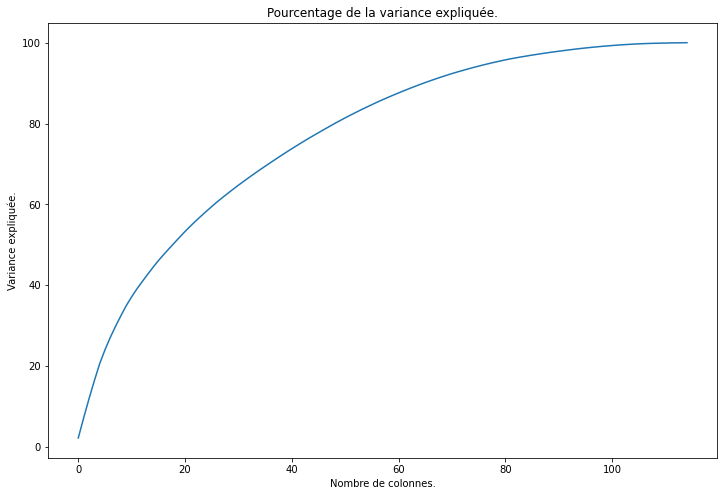

In [93]:
print(np.cumsum(np.round(tsvd.explained_variance_ratio_, decimals=4)*100))
plt.figure(figsize=(12,8))
plt.plot(np.cumsum(np.round(tsvd.explained_variance_ratio_, decimals=4)*100))
plt.title('Pourcentage de la variance expliquée.')
plt.ylabel('Variance expliquée.')
plt.xlabel('Nombre de colonnes.')
plt.savefig(fname='truncated_svd_explained_variance(exploration).png',bbox_inches='tight')
plt.show()
plt.close()

On va maintenant visualiser notre bag of words avec plusieurs paramètre de t-SNE

In [94]:
tsne=TSNE(perplexity= 20,n_iter=100000,n_iter_without_progress=1000,random_state=2,n_jobs=-1)

In [95]:
sne_values=tsne.fit_transform(decomposed_values,)

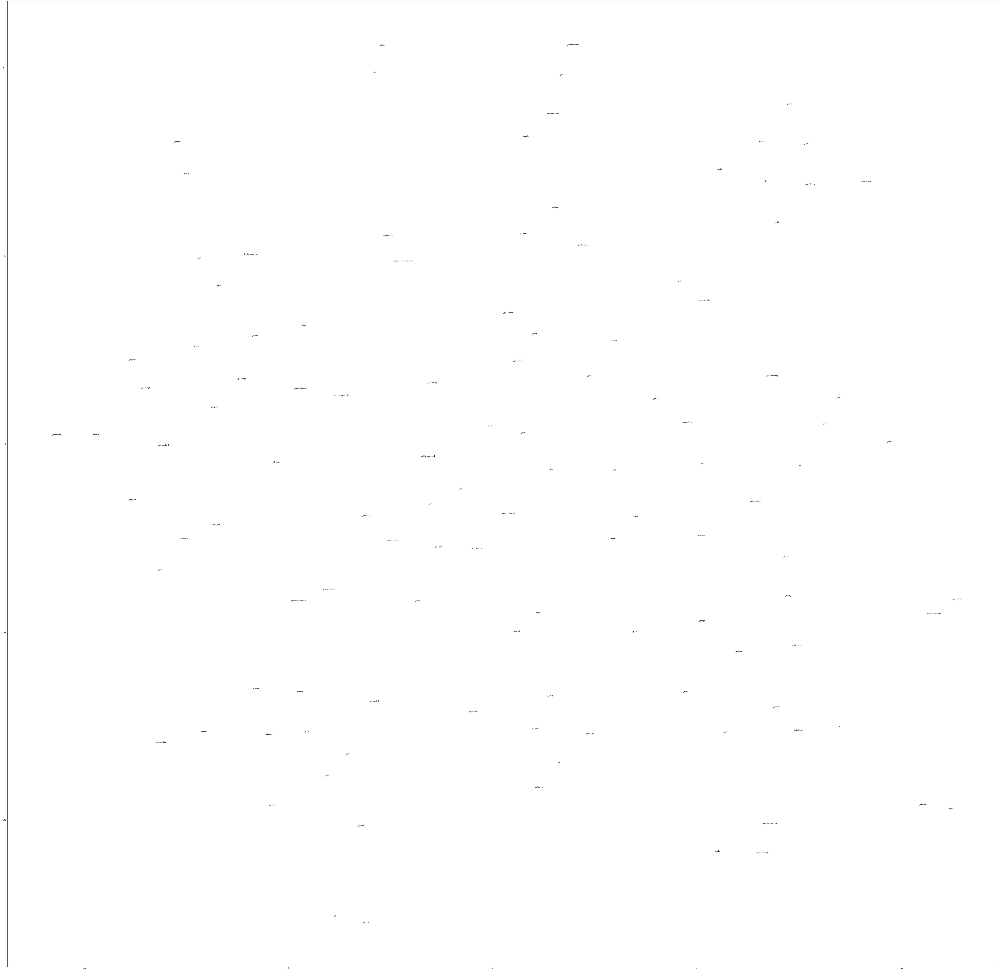

In [96]:
fig,ax = plt.subplots(figsize=(100,100))
ax=sns.scatterplot(x=sne_values[:,0],y=sne_values[:,1],)
for i, txt in enumerate(tag_similarity_df.keys()):
    plt.annotate(txt, (sne_values[i,0]+.05, sne_values[i,1]+0.005), fontsize=9)


In [97]:
tsne=TSNE(perplexity= 40,n_iter=100000,n_iter_without_progress=1000,random_state=2,n_jobs=-1)

In [98]:
sne_values=tsne.fit_transform(decomposed_values,)

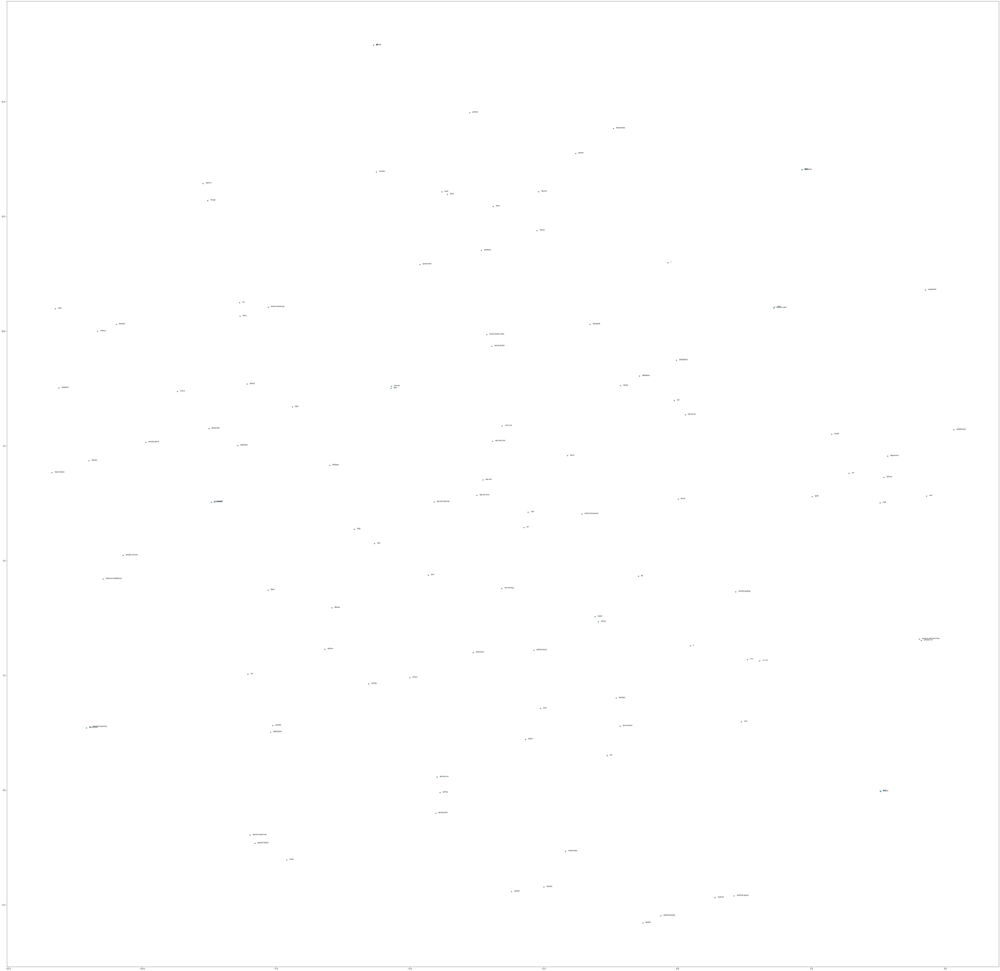

In [99]:
fig,ax = plt.subplots(figsize=(100,100))
ax=sns.scatterplot(x=sne_values[:,0],y=sne_values[:,1],)
for i, txt in enumerate(tag_similarity_df.keys()):
    plt.annotate(txt, (sne_values[i,0]+.05, sne_values[i,1]+0.005), fontsize=9)


In [100]:
tsne=TSNE(perplexity= 50,n_iter=100000,n_iter_without_progress=1000,random_state=2,n_jobs=-1)

In [101]:
sne_values=tsne.fit_transform(decomposed_values,)

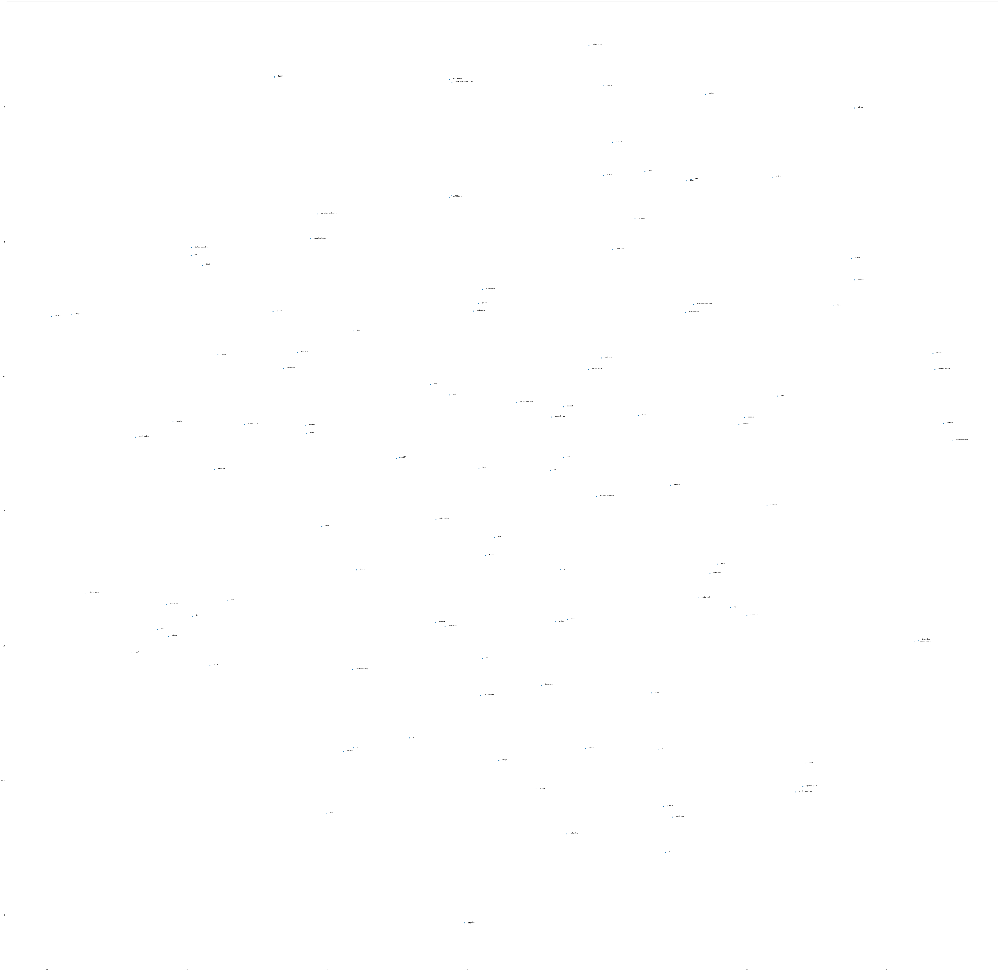

In [102]:
fig,ax = plt.subplots(figsize=(100,100))
ax=sns.scatterplot(x=sne_values[:,0],y=sne_values[:,1],)
for i, txt in enumerate(tag_similarity_df.keys()):
    plt.annotate(txt, (sne_values[i,0]+.05, sne_values[i,1]+0.005), fontsize=9)


In [103]:
tsne=TSNE(perplexity= 5,n_iter=100000,n_iter_without_progress=1000,random_state=2,n_jobs=-1)

In [104]:
sne_values=tsne.fit_transform(decomposed_values,)

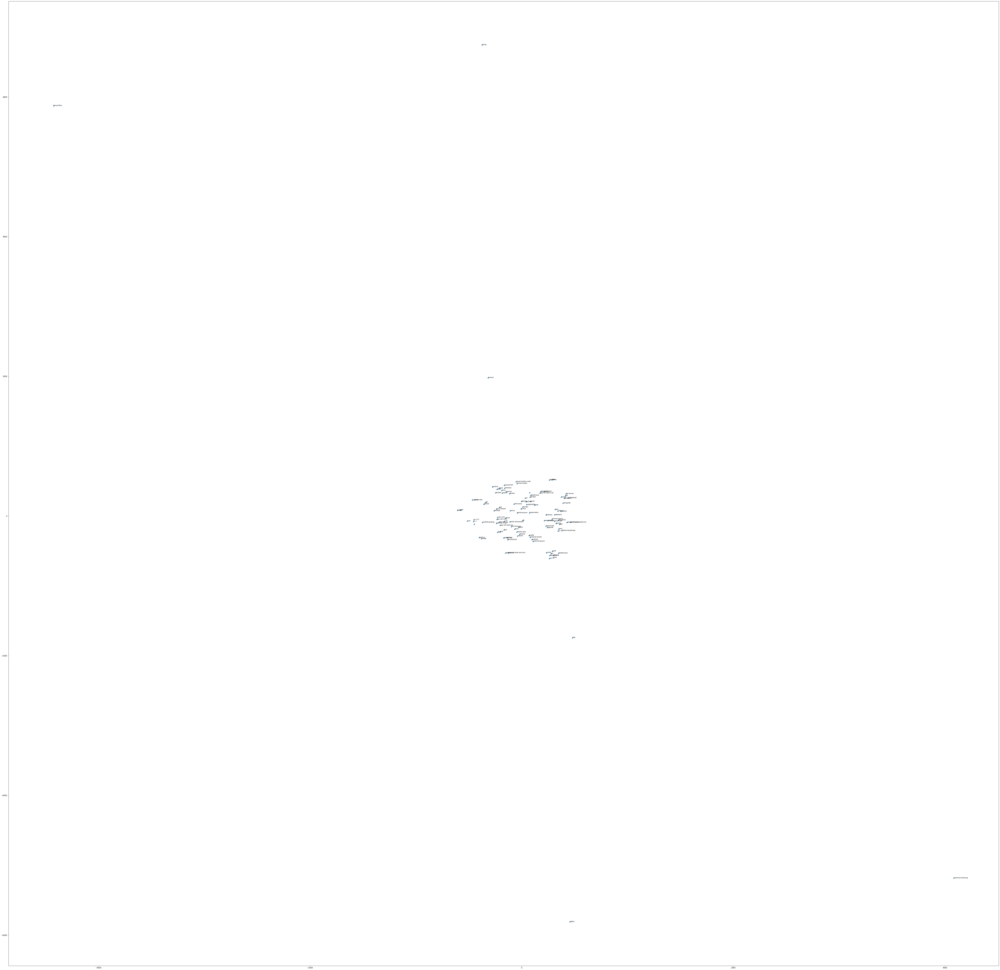

In [105]:
fig,ax = plt.subplots(figsize=(100,100))
ax=sns.scatterplot(x=sne_values[:,0],y=sne_values[:,1],)
for i, txt in enumerate(tag_similarity_df.keys()):
    plt.annotate(txt, (sne_values[i,0]+.05, sne_values[i,1]+0.005), fontsize=9)


On remarque que la visualisation la plus clusterisé est celle pour une perplexité de 5. On garde celle ci et pour aider à mesurer sa qualité on utilise des algorithme de clusterisation pour colorer les points.

In [106]:
tsne=TSNE(perplexity= 5,early_exaggeration=100,learning_rate=25,n_iter=400000,init='pca',n_iter_without_progress=500,random_state=2,n_jobs=-1)

In [107]:
sne_values=tsne.fit_transform(decomposed_values,)

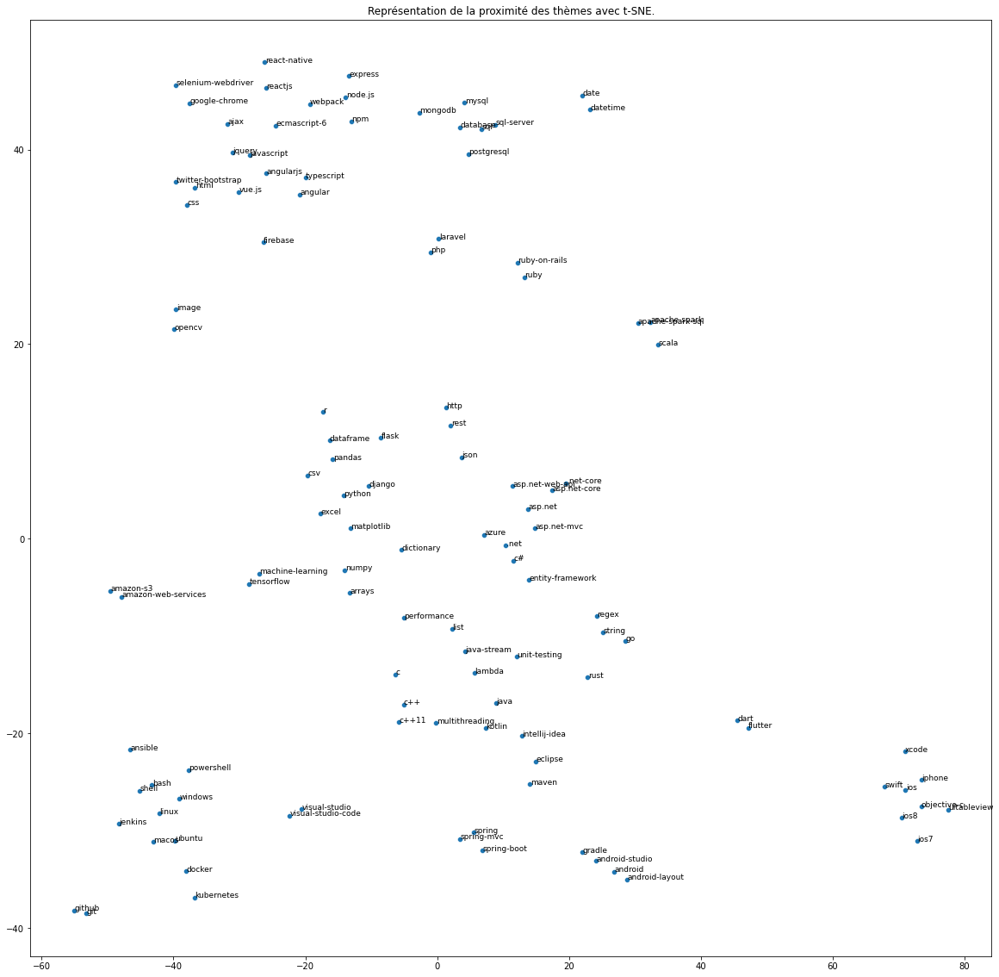

In [108]:
fig,ax = plt.subplots(figsize=(20,20))
ax=sns.scatterplot(x=sne_values[:,0],y=sne_values[:,1],)
for i, txt in enumerate(tag_similarity_df.keys()):
    plt.annotate(txt, (sne_values[i,0]+.05, sne_values[i,1]+0.005), fontsize=9)
plt.title('Représentation de la proximité des thèmes avec t-SNE.')
plt.savefig(fname='t-sne_manifold_learning_bag_of_words.png',bbox_inches='tight')
plt.show()
plt.close()

Sur les deux graphiques ci-dessus on voit déjà certains cluster, notamment autour de l'univers python avec plusieurs framework, bibliothèques et outils autour de "python".

In [109]:
cluster_df=pd.DataFrame({'x':sne_values[:,0],'y':sne_values[:,1],'keyword':tag_similarity_df.keys()})

In [110]:
cluster_df

,x,y,keyword
0,-14.192547,4.462386,python
1,-28.428930,39.407600,javascript
2,8.950562,-16.918068,java
3,26.844973,-34.212002,android
4,71.056038,-25.816153,ios
...,...,...,...
110,77.494637,-27.847317,uitableview
111,4.265265,-11.570372,java-stream
112,28.754639,-35.019169,android-layout
113,22.839281,-14.235870,rust


In [111]:
tags_frequency_mf[tags_frequency_mf>10]

python                12034.0
javascript            11118.0
android                8163.0
java                   7622.0
ios                    5974.0
                       ...   
fortran                  11.0
2d                       11.0
bots                     11.0
query-optimization       11.0
odbc                     11.0
Length: 1075, dtype: float64

In [112]:
tags_frequency_mf.index[:20]

Index(['python', 'javascript', 'android', 'java', 'ios', 'c#', 'swift', 'html',
       'css', 'php', 'node.js', 'angular', 'c++', 'reactjs', 'angularjs',
       'jquery', 'git', 'pandas', 'r', 'typescript'],
      dtype='object')

In [113]:
spec_clust=SpectralClustering(n_clusters=20)

In [114]:
spec_df=cluster_df.copy()
spec_df['label']=spec_clust.fit_predict(cluster_df[['x','y']])

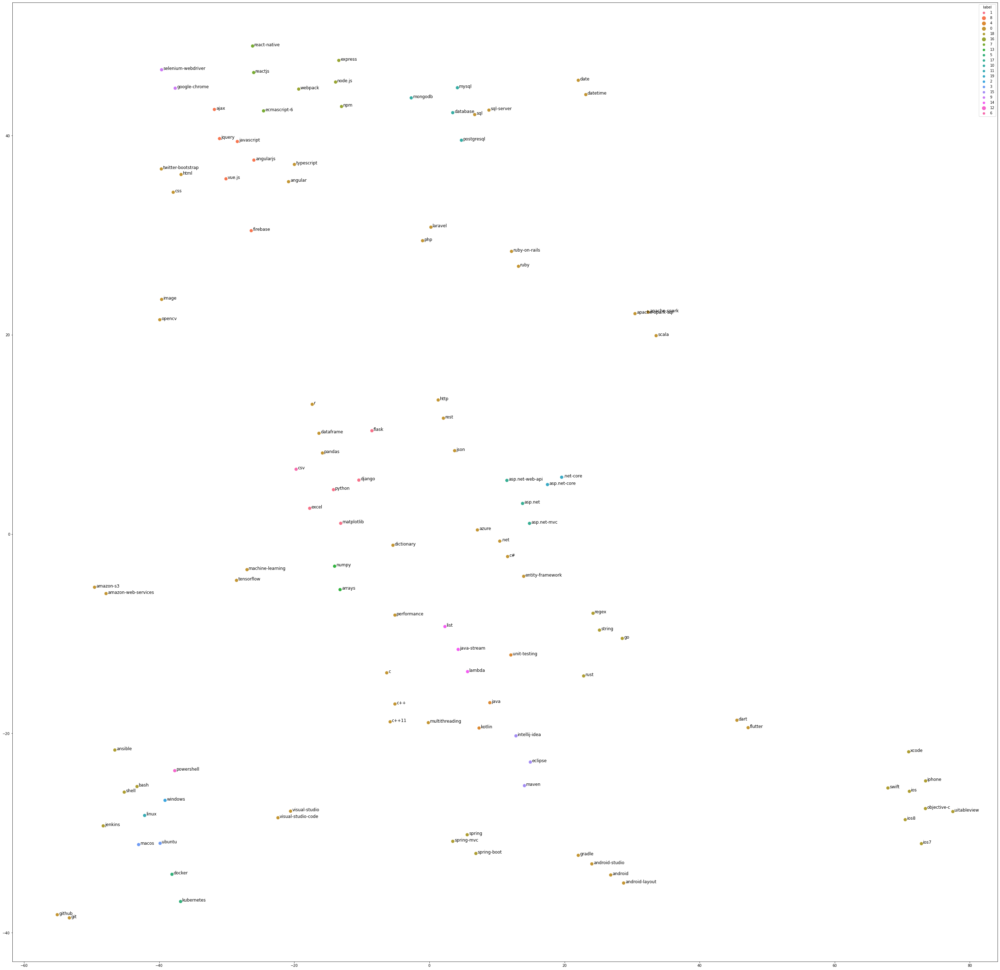

In [115]:
fig,ax = plt.subplots(figsize=(50,50))
ax=sns.scatterplot(x=sne_values[:,0],y=sne_values[:,1],size=spec_df.label,sizes=(100,100),hue=spec_df.label.apply(str))
for i, txt in enumerate(tag_similarity_df.keys()):
    plt.annotate(txt, (sne_values[i,0]+.25, sne_values[i,1]), fontsize=12)


In [116]:
agg_ward_df=cluster_df.copy()
agg_clus_ward=AgglomerativeClustering(n_clusters=20)
agg_ward_df['label']=agg_clus_ward.fit_predict(cluster_df[['x','y']])

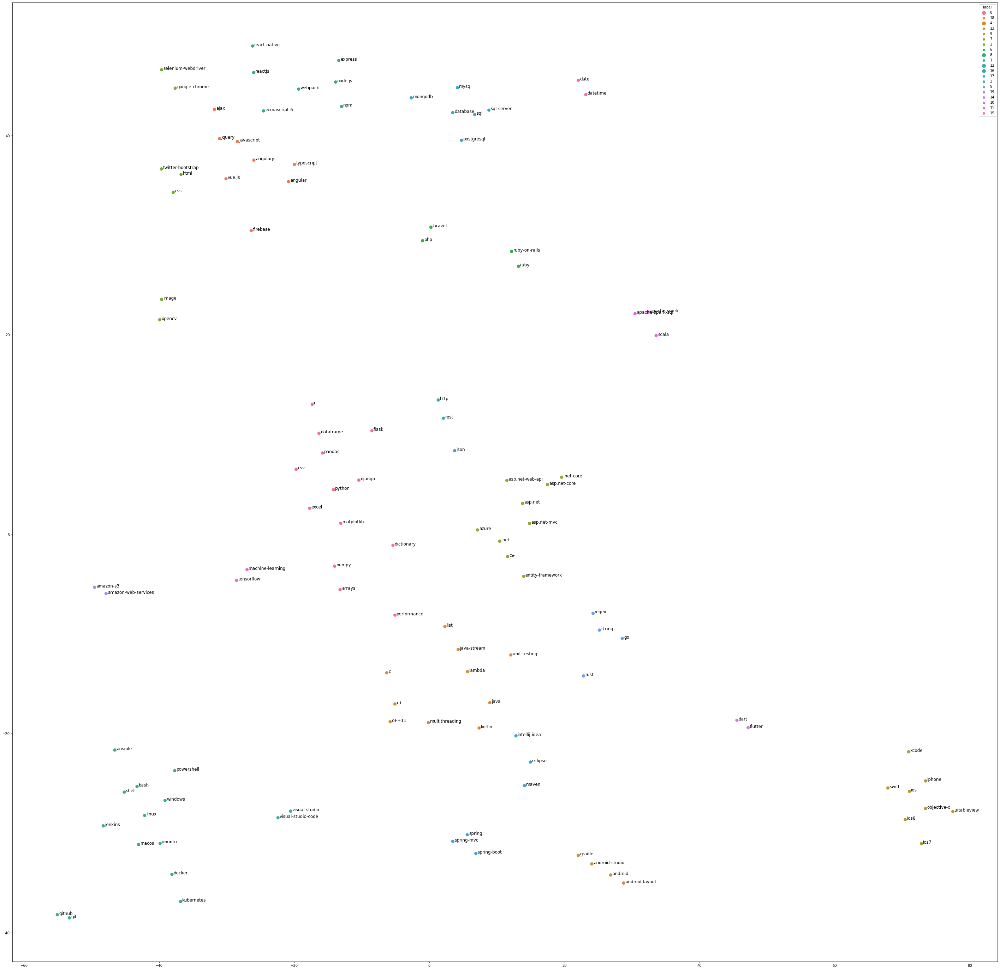

In [117]:
fig,ax = plt.subplots(figsize=(50,50))
ax=sns.scatterplot(x=sne_values[:,0],y=sne_values[:,1],size=agg_ward_df.label,sizes=(100,100),hue=agg_ward_df.label.apply(str))
for i, txt in enumerate(tag_similarity_df.keys()):
    plt.annotate(txt, (sne_values[i,0]+.25, sne_values[i,1]), fontsize=12)


In [118]:
agg_avg_df=cluster_df.copy()
agg_clus_avg=AgglomerativeClustering(n_clusters=20,linkage='average',affinity='cosine')
agg_avg_df['label']=agg_clus_avg.fit_predict(cluster_df[['x','y']])

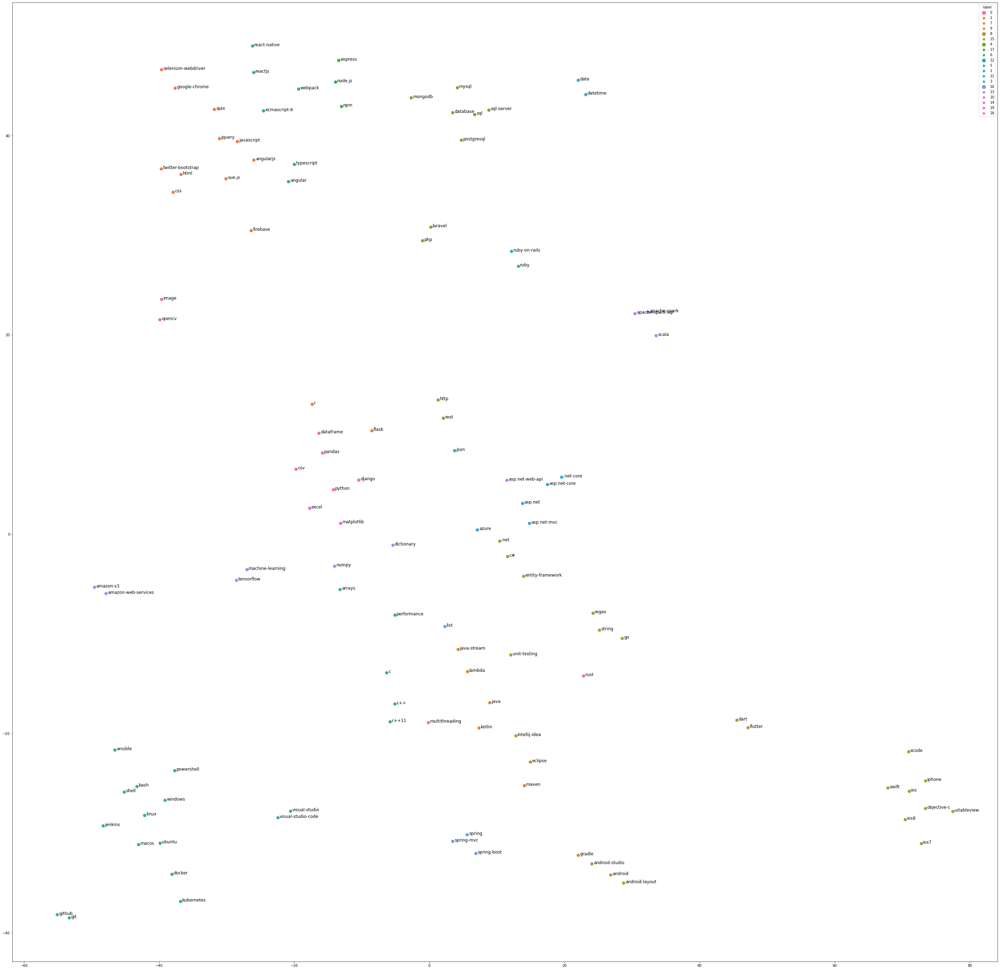

In [119]:
fig,ax = plt.subplots(figsize=(50,50))
ax=sns.scatterplot(x=sne_values[:,0],y=sne_values[:,1],size=agg_avg_df.label,sizes=(100,100),hue=agg_avg_df.label.apply(str))
for i, txt in enumerate(tag_similarity_df.keys()):
    plt.annotate(txt, (sne_values[i,0]+.25, sne_values[i,1]), fontsize=12)


In [120]:
db_euc_df=cluster_df.copy()
db_euc=DBSCAN(eps=2,min_samples=3,)
db_euc_df['label']=db_euc.fit_predict(cluster_df[['x','y']])

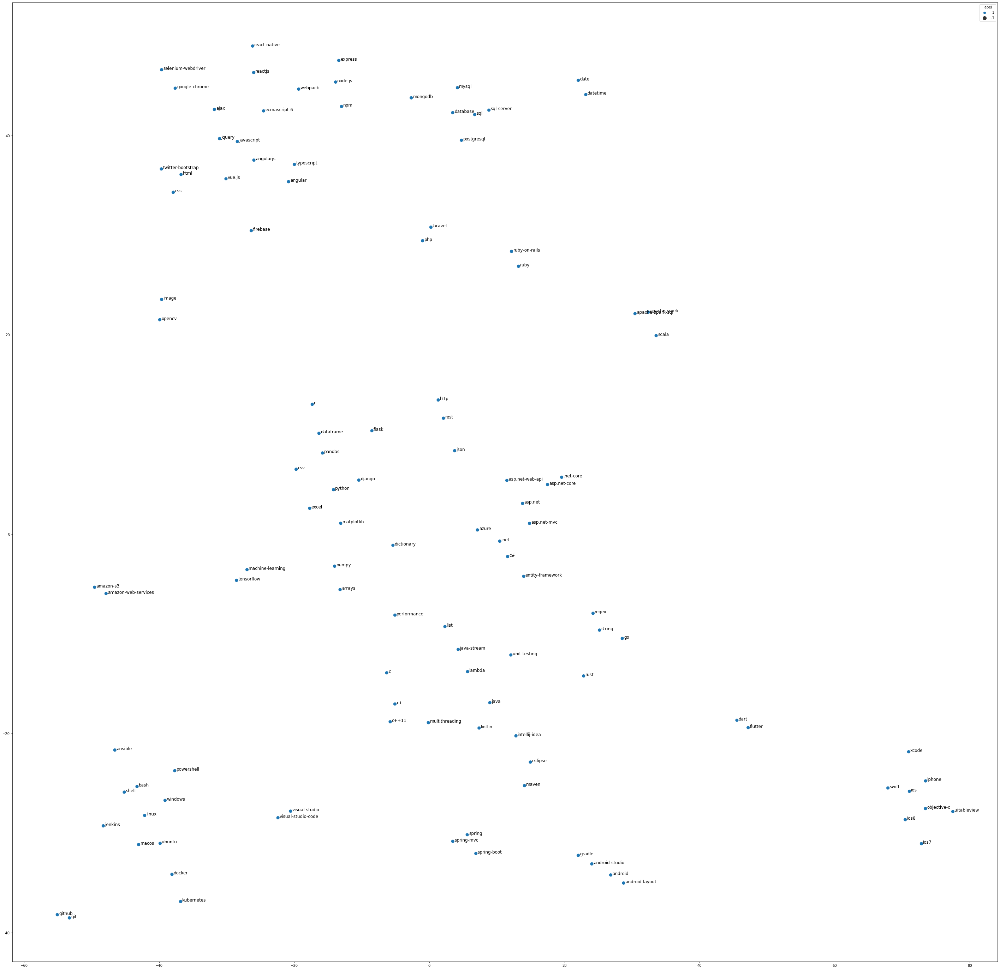

In [121]:
fig,ax = plt.subplots(figsize=(50,50))
ax=sns.scatterplot(x=sne_values[:,0],y=sne_values[:,1],size=db_euc_df.label,sizes=(100,100),hue=db_euc_df.label.apply(str))
for i, txt in enumerate(tag_similarity_df.keys()):
    plt.annotate(txt, (sne_values[i,0]+.25, sne_values[i,1]), fontsize=12)


In [122]:
db_cos_df=cluster_df.copy()
db_cos=DBSCAN(eps=50,min_samples=2,)
db_cos_df['label']=db_cos.fit_predict(cluster_df[['x','y']])

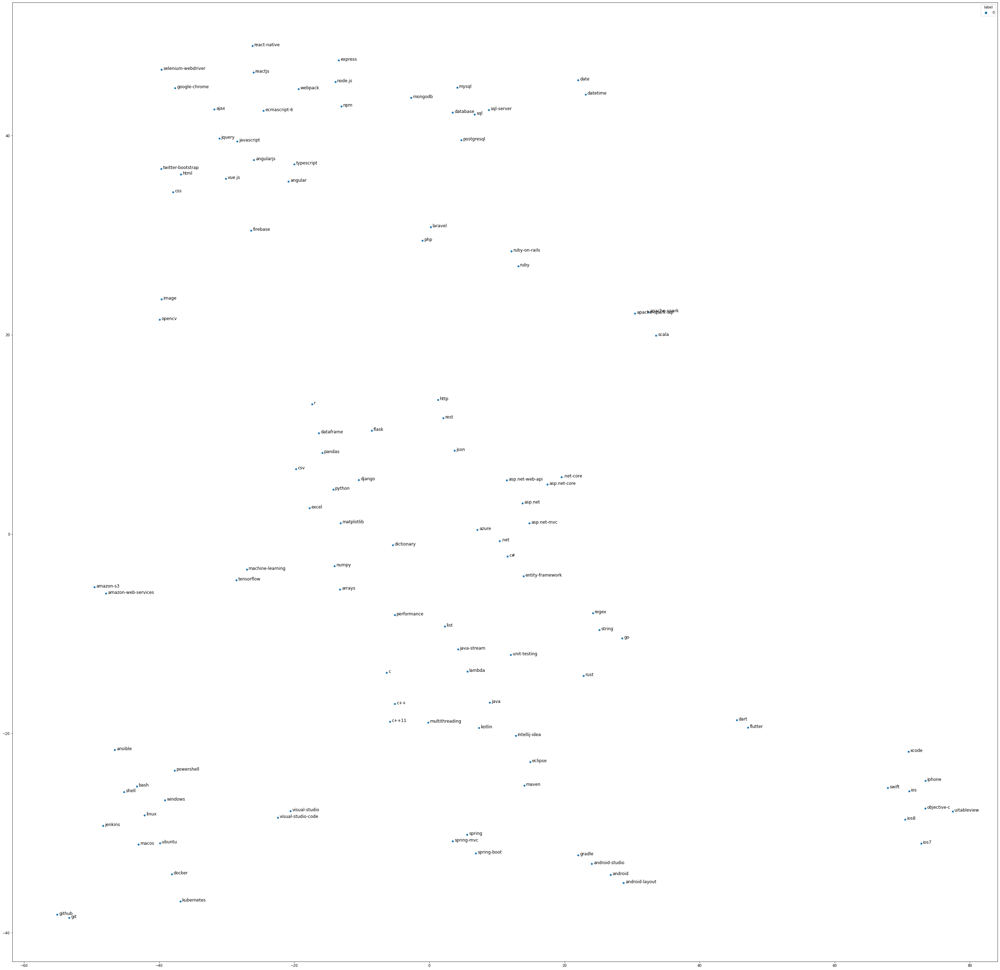

In [123]:
fig,ax = plt.subplots(figsize=(50,50))
ax=sns.scatterplot(x=sne_values[:,0],y=sne_values[:,1],hue=db_cos_df.label.apply(str))
for i, txt in enumerate(tag_similarity_df.keys()):
    plt.annotate(txt, (sne_values[i,0]+.25, sne_values[i,1]), fontsize=12)


La clusterisation par affinitypropagation semble faire très peu d'erreur sur les thèmes proches.

In [124]:
aff_df=cluster_df.copy()
affprop= AffinityPropagation(random_state=2,max_iter=1000,)
aff_df['label']=affprop.fit_predict(cluster_df[['x','y']])
cluster_centers_indices = affprop.cluster_centers_indices_

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:18: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.


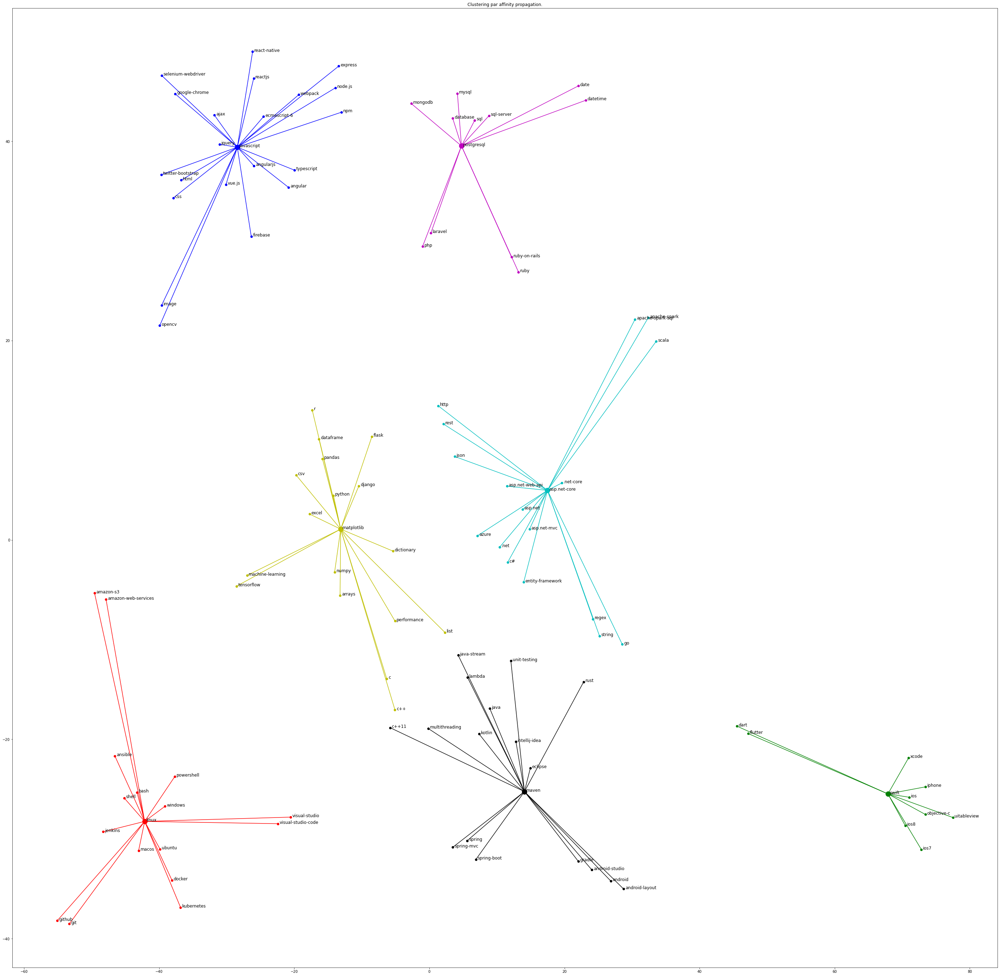

In [125]:
from itertools import cycle
colors = cycle('bgrcmykbgrcmykbgrcmykbgrcmyk')
hue_colors=[col for k,col in zip(aff_df.label.unique(),colors)]
fig,ax = plt.subplots(figsize=(50,50))
#ax=sns.scatterplot(x=sne_values[:,0],y=sne_values[:,1],hue=[hue_colors[i] for i in aff_df.label])
for i, txt in enumerate(tag_similarity_df.keys()):
    plt.annotate(txt, (sne_values[i,0]+.25, sne_values[i,1]), fontsize=12)
for k,col in zip(range(aff_df.label.nunique()),colors):
    class_members = aff_df.label == k
    cluster_center = sne_values[cluster_centers_indices[k]]
    plt.plot(cluster_center[0], cluster_center[1], 'o',c=[hue_colors[i] for i in aff_df.label[class_members]][0],
              markersize=14)
    for x in sne_values[class_members]:
        plt.plot(x[0],x[1],marker='o',c=[hue_colors[i] for i in aff_df.label[class_members]][0])
        plt.plot([cluster_center[0], x[0]], [cluster_center[1], x[1]],c=[hue_colors[i] for i in aff_df.label[class_members]][0])
plt.title('Clustering par affinity propagation.')
plt.savefig(fname='t-SNE_and_affinity_propagation.png',bbox_inches='tight')
fig.show()

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:18: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.


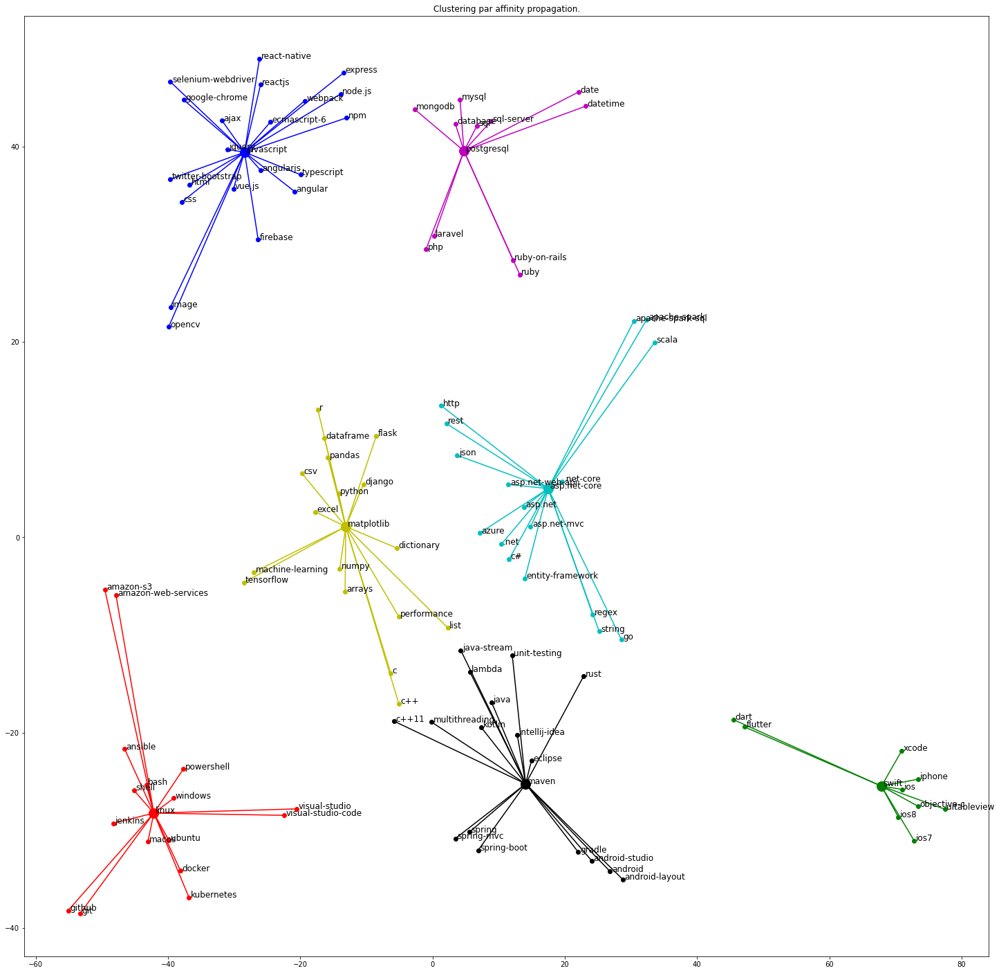

In [126]:
from itertools import cycle
colors = cycle('bgrcmykbgrcmykbgrcmykbgrcmyk')
hue_colors=[col for k,col in zip(aff_df.label.unique(),colors)]
fig,ax = plt.subplots(figsize=(25,25))
#ax=sns.scatterplot(x=sne_values[:,0],y=sne_values[:,1],hue=[hue_colors[i] for i in aff_df.label])
for i, txt in enumerate(tag_similarity_df.keys()):
    plt.annotate(txt, (sne_values[i,0]+.25, sne_values[i,1]), fontsize=12)
for k,col in zip(range(aff_df.label.nunique()),colors):
    class_members = aff_df.label == k
    cluster_center = sne_values[cluster_centers_indices[k]]
    plt.plot(cluster_center[0], cluster_center[1], 'o',c=[hue_colors[i] for i in aff_df.label[class_members]][0],
              markersize=14)
    for x in sne_values[class_members]:
        plt.plot(x[0],x[1],marker='o',c=[hue_colors[i] for i in aff_df.label[class_members]][0])
        plt.plot([cluster_center[0], x[0]], [cluster_center[1], x[1]],c=[hue_colors[i] for i in aff_df.label[class_members]][0])
plt.title('Clustering par affinity propagation.')
plt.savefig(fname='t-SNE_and_affinity_propagation2.png',bbox_inches='tight')
fig.show()

In [127]:
del decomposed_values
del values
del tags_extracted

In [128]:
pd.Series(tag_similarity_df).apply(len)

python            8117132
javascript        7790035
java              5529656
android           5832106
ios               4223910
                   ...   
uitableview        280497
java-stream        257050
android-layout     270104
rust               225697
csv                249876
Length: 115, dtype: int64

In [129]:
query['Body_Trigrams'].head()

0    [(i, have, a), (have, a, project), (a, project...
1    [(this, must, be), (must, be, simple), (be, si...
4    [(in, the, example), (the, example, below), (e...
5    [(there, are, many), (are, many, types), (many...
7    [(i, am, having), (am, having, some), (having,...
Name: Body_Trigrams, dtype: object

In [130]:
tag_similarity_df_words=pd.Series(tag_similarity_df).apply(str).apply(str.lower).apply(Toknzr.tokenize)

In [131]:
tag_similarity_df_words

python            [this, must, be, simple, but, as, an, only, oc...
javascript        [i, need, to, change, the, src, for, an, html,...
java              [i, recently, noticed, that, string, replaceal...
android           [i, have, a, project, that, uses, a, few, othe...
ios               [i, have, assigned, a, custom, font, of, helve...
                                        ...                        
uitableview       [i, noticed, that, in, ios, uitableviewcells, ...
java-stream       [is, it, possible, to, create, a, stream, from...
android-layout    [i, have, a, simple, layout, as, follows, scro...
rust              [how, can, i, create, what, other, languages, ...
csv               [what, can, i, use, to, diff, two, csv, files,...
Length: 115, dtype: object

In [132]:
frequency_by_tag=dict()
frequency_by_tag={i:nltk.FreqDist(tag_similarity_df_words[i]) for i in tag_similarity_df_words.index}

In [133]:
frequency_by_tag

{'python': FreqDist({'i': 50654, 'the': 46300, 'to': 36057, 'a': 31738, 'in': 21063, 'is': 19313, 'and': 16856, 'of': 14318, 'this': 14082, 'it': 12667, ...}),
 'javascript': FreqDist({'i': 44664, 'the': 44239, 'to': 32656, 'a': 24282, 'is': 19753, 'this': 18250, 'in': 15635, 'and': 14598, 'it': 13376, 'of': 11008, ...}),
 'java': FreqDist({'i': 29799, 'the': 28150, 'to': 21857, 'a': 16275, 'is': 13561, 'in': 11042, 'and': 10860, 'this': 9413, 'it': 8825, 'of': 8504, ...}),
 'android': FreqDist({'the': 32241, 'i': 32045, 'to': 23822, 'android': 20932, 'is': 12998, 'a': 12853, 'in': 11554, 'and': 11527, 'this': 9920, 'it': 9777, ...}),
 'ios': FreqDist({'the': 27016, 'i': 24311, 'to': 19116, 'a': 11655, 'in': 9991, 'is': 9900, 'and': 9155, 'it': 7410, 'this': 7250, 'of': 6061, ...}),
 'c#': FreqDist({'i': 22508, 'the': 22390, 'to': 16388, 'a': 12012, 'is': 9416, 'in': 8278, 'and': 7600, 'this': 7064, 'it': 6482, 'of': 5679, ...}),
 'swift': FreqDist({'i': 16142, 'the': 15636, 'to': 1268

In [134]:
word_frequency_tags=dict()
for idx in tag_similarity_df_words.index:
    word_frequency_tags[idx]=dict()
    for key,value in frequency_by_tag[idx].items():
        print(idx)
        if key not in word_frequency_tags[idx].keys():
            word_frequency_tags[idx][key]=0
        word_frequency_tags[idx][key]+=value

    word_frequency_tags[idx]=pd.Series(word_frequency_tags[idx]).sort_values(ascending=False)

python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python

python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python

python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python

python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python

python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python

python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python

python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python

python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python

python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python

python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python

python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python

python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python
python

javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript

javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript

javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript

javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript

javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript

javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript

javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript

javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript

javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript

javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript

javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript

javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript
javascript

java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java


java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java


java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java


java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java


java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java


java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java


java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java


java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java


java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java


java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java


java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java
java


android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android


android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android


android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android


android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android


android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android


android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android


android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android


android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android


android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android


android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android
android


ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios


ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios


ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios


ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios


ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios


ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios


ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios


ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios
ios


c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c

c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c

c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c

c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c

c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c#
c

swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swif

swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swif

swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swif

swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swif

swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swif

swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swif

swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swif

swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swift
swif

html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html


html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html


html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html


html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html


html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html


html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
html
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css


css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css


css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css


css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css
css


php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php


php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php


php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php


php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php


php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php
php


node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js


node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js


node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js


node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js


node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js
node.js


angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular


angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular


angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular


angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular


angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular
angular


c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++


c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++


c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++


c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++
c++


laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel


laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel


laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel


laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel
laravel


reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs


reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs


reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs


reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs


reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs
reactjs


xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcod

xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcod

xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcod

xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcode
xcod

angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs


angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs


angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs


angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs


angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs
angularjs


jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery

jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery

jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery

jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery
jquery

git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git


git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git


git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git
git


pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas

pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas

pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas

pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas
pandas

visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual

visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual

visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual-studio
visual

typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript

typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript

typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript

typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript

typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript
typescript

r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r


r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r
r


json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json


json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json


json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json


json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
json
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
r

ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-o

ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-on-rails
ruby-o

arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays

arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays

arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays

arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays
arrays

docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker

docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker

docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker
docker

twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bo

twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bootstrap
twitter-bo

objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
obje

objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
obje

objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
obje

objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
obje

objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
objective-c
obje

android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-st

android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-studio
android-st

sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql


sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql


sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql
sql


asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.

asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.

asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.net-mvc
asp.

spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring

spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring

spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring

spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring
spring

.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net


.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net


.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net


.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net
.net


mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysq

mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysql
mysq

django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django

django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django

django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django
django

linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linu

linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linu

linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linu

linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linux
linu

go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
go
g

string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string

string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string

string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string
string

bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash


bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash


bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash
bash


sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server

sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server
sql-server

c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c


c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c
c


asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core

asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core
asp.net-core

amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services


amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services


amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services
amazon-web-services


windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows


windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows


windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows
windows


postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql

postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql
postgresql

macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
maco

macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
maco

macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
macos
maco

numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
nump

numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
nump

numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
numpy
nump

flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter


flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter
flutter


react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native

react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native

react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native
react-native

asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net


asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net


asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net
asp.net


ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby


ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby
ruby


mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb


mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb


mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb
mongodb


dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe


dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe
dataframe


apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark

apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark

apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark
apache-spark

intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intell

intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intellij-idea
intell

gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle

gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle
gradle

github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github

github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github
github

scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scal

scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scala
scal

regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
rege

regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
regex
rege

kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin

kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin

kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin
kotlin

iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone

iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone
iphone

firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
f

firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
f

firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
firebase
f

unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing

unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing

unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing
unit-testing

matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib

matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib
matplotlib

ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu
ubuntu

spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spri

spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spri

spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spring-boot
spri

c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++1

c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++11
c++1

google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google

google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google-chrome
google

ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6

ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6

ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6
ecmascript-6

visual-studio-code
visual-studio-code
visual-studio-code
visual-studio-code
visual-studio-code
visual-studio-code
visual-studio-code
visual-studio-code
visual-studio-code
visual-studio-code
visual-studio-code
visual-studio-code
visual-studio-code
visual-studio-code
visual-studio-code
visual-studio-code
visual-studio-code
visual-studio-code
visual-studio-code
visual-studio-code
visual-studio-code
visual-studio-code
visual-studio-code
visual-studio-code
visual-studio-code
visual-studio-code
visual-studio-code
visual-studio-code
visual-studio-code
visual-studio-code
visual-studio-code
visual-studio-code
visual-studio-code
visual-studio-code
visual-studio-code
visual-studio-code
visual-studio-code
visual-studio-code
visual-studio-code
visual-studio-code
visual-studio-code
visual-studio-code
visual-studio-code
visual-studio-code
visual-studio-code
visual-studio-code
visual-studio-code
visual-studio-code
visual-studio-code
visual-studio-code
visual-studio-code
visual-studio-code
visual-studi

npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm


npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm
npm


dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart


dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart


dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart
dart


vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js

vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
vue.js
selenium-webdriver
selenium-webdriver
selenium-webdriver
selenium-webdriver
selenium-webdriver
selenium-webdriver
selenium-webdriver
selenium-webdriver
selenium-webdriver
selenium-webdriver
selenium-webdriver
selenium-webdriver
selenium-webdriver
selenium-webdriver
selenium-webdriver
selenium-webdriver
selenium-webdriver
selenium-webdriver
selenium-webdriver
selenium-webdriver
selenium-webdriver
selenium-webdriver
s

selenium-webdriver
selenium-webdriver
selenium-webdriver
selenium-webdriver
selenium-webdriver
selenium-webdriver
selenium-webdriver
selenium-webdriver
selenium-webdriver
selenium-webdriver
selenium-webdriver
selenium-webdriver
selenium-webdriver
selenium-webdriver
selenium-webdriver
selenium-webdriver
selenium-webdriver
selenium-webdriver
selenium-webdriver
selenium-webdriver
selenium-webdriver
selenium-webdriver
selenium-webdriver
selenium-webdriver
selenium-webdriver
selenium-webdriver
selenium-webdriver
selenium-webdriver
selenium-webdriver
selenium-webdriver
selenium-webdriver
selenium-webdriver
selenium-webdriver
selenium-webdriver
selenium-webdriver
selenium-webdriver
selenium-webdriver
selenium-webdriver
selenium-webdriver
selenium-webdriver
selenium-webdriver
selenium-webdriver
selenium-webdriver
selenium-webdriver
selenium-webdriver
selenium-webdriver
selenium-webdriver
selenium-webdriver
selenium-webdriver
selenium-webdriver
selenium-webdriver
selenium-webdriver
selenium-web

entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framewo

entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framework
entity-framewo

shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shel

shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shell
shel

list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list


list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
list
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell


powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell
powershell

eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse


eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse
eclipse


dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary

dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary
dictionary

maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
mave

maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
maven
mave

tensorflow
tensorflow
tensorflow
tensorflow
tensorflow
tensorflow
tensorflow
tensorflow
tensorflow
tensorflow
tensorflow
tensorflow
tensorflow
tensorflow
tensorflow
tensorflow
tensorflow
tensorflow
tensorflow
tensorflow
tensorflow
tensorflow
tensorflow
tensorflow
tensorflow
tensorflow
tensorflow
tensorflow
tensorflow
tensorflow
tensorflow
tensorflow
tensorflow
tensorflow
tensorflow
tensorflow
tensorflow
tensorflow
tensorflow
tensorflow
tensorflow
tensorflow
tensorflow
tensorflow
tensorflow
tensorflow
tensorflow
tensorflow
tensorflow
tensorflow
tensorflow
tensorflow
tensorflow
tensorflow
tensorflow
tensorflow
tensorflow
tensorflow
tensorflow
tensorflow
tensorflow
tensorflow
tensorflow
tensorflow
tensorflow
tensorflow
tensorflow
tensorflow
tensorflow
tensorflow
tensorflow
tensorflow
tensorflow
tensorflow
tensorflow
tensorflow
tensorflow
tensorflow
tensorflow
tensorflow
tensorflow
tensorflow
tensorflow
tensorflow
tensorflow
tensorflow
tensorflow
tensorflow
tensorflow
tensorflow
tensorflow

datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
d

datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
datetime
d

rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest


rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest
rest


express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express


express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express
express


date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date
date


http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http


http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http
http


.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core


.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core
.net-core


webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack
webpack


jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins


jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins
jenkins


multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithrea

multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithreading
multithrea

database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
d

database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
database
d

asp.net-web-api
asp.net-web-api
asp.net-web-api
asp.net-web-api
asp.net-web-api
asp.net-web-api
asp.net-web-api
asp.net-web-api
asp.net-web-api
asp.net-web-api
asp.net-web-api
asp.net-web-api
asp.net-web-api
asp.net-web-api
asp.net-web-api
asp.net-web-api
asp.net-web-api
asp.net-web-api
asp.net-web-api
asp.net-web-api
asp.net-web-api
asp.net-web-api
asp.net-web-api
asp.net-web-api
asp.net-web-api
asp.net-web-api
asp.net-web-api
asp.net-web-api
asp.net-web-api
asp.net-web-api
asp.net-web-api
asp.net-web-api
asp.net-web-api
asp.net-web-api
asp.net-web-api
asp.net-web-api
asp.net-web-api
asp.net-web-api
asp.net-web-api
asp.net-web-api
asp.net-web-api
asp.net-web-api
asp.net-web-api
asp.net-web-api
asp.net-web-api
asp.net-web-api
asp.net-web-api
asp.net-web-api
asp.net-web-api
asp.net-web-api
asp.net-web-api
asp.net-web-api
asp.net-web-api
asp.net-web-api
asp.net-web-api
asp.net-web-api
asp.net-web-api
asp.net-web-api
asp.net-web-api
asp.net-web-api
asp.net-web-api
asp.net-web-api
asp.net-

performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
perf

performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
performance
perf

azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azur

azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azure
azur

lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda

lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda
lambda

ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible
ansible


apache-spark-sql
apache-spark-sql
apache-spark-sql
apache-spark-sql
apache-spark-sql
apache-spark-sql
apache-spark-sql
apache-spark-sql
apache-spark-sql
apache-spark-sql
apache-spark-sql
apache-spark-sql
apache-spark-sql
apache-spark-sql
apache-spark-sql
apache-spark-sql
apache-spark-sql
apache-spark-sql
apache-spark-sql
apache-spark-sql
apache-spark-sql
apache-spark-sql
apache-spark-sql
apache-spark-sql
apache-spark-sql
apache-spark-sql
apache-spark-sql
apache-spark-sql
apache-spark-sql
apache-spark-sql
apache-spark-sql
apache-spark-sql
apache-spark-sql
apache-spark-sql
apache-spark-sql
apache-spark-sql
apache-spark-sql
apache-spark-sql
apache-spark-sql
apache-spark-sql
apache-spark-sql
apache-spark-sql
apache-spark-sql
apache-spark-sql
apache-spark-sql
apache-spark-sql
apache-spark-sql
apache-spark-sql
apache-spark-sql
apache-spark-sql
apache-spark-sql
apache-spark-sql
apache-spark-sql
apache-spark-sql
apache-spark-sql
apache-spark-sql
apache-spark-sql
apache-spark-sql
apache-spark-s

image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
imag

image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
image
imag

spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc

spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc
spring-mvc

ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax
ajax


kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes

kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
kubernetes
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
exc

excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
excel
exce

flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flas

flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
flask
opencv
opencv
opencv
opencv
opencv
openc

opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv
opencv

machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learni

machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learning
machine-learni

ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7
ios7


amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3


amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3
amazon-s3


ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8
ios8


uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uita

uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uitableview
uita

java-stream
java-stream
java-stream
java-stream
java-stream
java-stream
java-stream
java-stream
java-stream
java-stream
java-stream
java-stream
java-stream
java-stream
java-stream
java-stream
java-stream
java-stream
java-stream
java-stream
java-stream
java-stream
java-stream
java-stream
java-stream
java-stream
java-stream
java-stream
java-stream
java-stream
java-stream
java-stream
java-stream
java-stream
java-stream
java-stream
java-stream
java-stream
java-stream
java-stream
java-stream
java-stream
java-stream
java-stream
java-stream
java-stream
java-stream
java-stream
java-stream
java-stream
java-stream
java-stream
java-stream
java-stream
java-stream
java-stream
java-stream
java-stream
java-stream
java-stream
java-stream
java-stream
java-stream
java-stream
java-stream
java-stream
java-stream
java-stream
java-stream
java-stream
java-stream
java-stream
java-stream
java-stream
java-stream
java-stream
java-stream
java-stream
java-stream
java-stream
java-stream
java-stream
java-stream
java

android-layout
android-layout
android-layout
android-layout
android-layout
android-layout
android-layout
android-layout
android-layout
android-layout
android-layout
android-layout
android-layout
android-layout
android-layout
android-layout
android-layout
android-layout
android-layout
android-layout
android-layout
android-layout
android-layout
android-layout
android-layout
android-layout
android-layout
android-layout
android-layout
android-layout
android-layout
android-layout
android-layout
android-layout
android-layout
android-layout
android-layout
android-layout
android-layout
android-layout
android-layout
android-layout
android-layout
android-layout
android-layout
android-layout
android-layout
android-layout
android-layout
android-layout
android-layout
android-layout
android-layout
android-layout
android-layout
android-layout
android-layout
android-layout
android-layout
android-layout
android-layout
android-layout
android-layout
android-layout
android-layout
android-layout
android-la

rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust


rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
rust
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
c

csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv
csv


In [135]:
for i in word_frequency_tags.keys(): 
    if 'android' in word_frequency_tags[i][:10]:
        print(i,'\n\n',word_frequency_tags[i][:20],4*'\n')

android 

 the        32241
i          32045
to         23822
android    20932
is         12998
a          12853
in         11554
and        11527
this        9920
it          9777
my          7630
of          7100
but         6224
that        6069
for         6066
have        5370
on          5184
app         5167
with        4973
can         4859
dtype: int64 




android-studio 

 i          5443
the        4688
android    3875
to         3747
in         2007
and        1949
is         1810
studio     1760
a          1705
it         1668
my         1414
this       1402
gradle     1219
project    1217
of          964
but         955
build       945
for         942
error       927
com         882
dtype: int64 




gradle 

 i          3341
the        3029
to         2511
gradle     2267
android    1642
build      1342
a          1279
is         1252
in         1208
and        1188
project    1020
this        964
my          911
it          910
com         757
of          663
for      

In [136]:
frequency_by_tag

{'python': FreqDist({'i': 50654, 'the': 46300, 'to': 36057, 'a': 31738, 'in': 21063, 'is': 19313, 'and': 16856, 'of': 14318, 'this': 14082, 'it': 12667, ...}),
 'javascript': FreqDist({'i': 44664, 'the': 44239, 'to': 32656, 'a': 24282, 'is': 19753, 'this': 18250, 'in': 15635, 'and': 14598, 'it': 13376, 'of': 11008, ...}),
 'java': FreqDist({'i': 29799, 'the': 28150, 'to': 21857, 'a': 16275, 'is': 13561, 'in': 11042, 'and': 10860, 'this': 9413, 'it': 8825, 'of': 8504, ...}),
 'android': FreqDist({'the': 32241, 'i': 32045, 'to': 23822, 'android': 20932, 'is': 12998, 'a': 12853, 'in': 11554, 'and': 11527, 'this': 9920, 'it': 9777, ...}),
 'ios': FreqDist({'the': 27016, 'i': 24311, 'to': 19116, 'a': 11655, 'in': 9991, 'is': 9900, 'and': 9155, 'it': 7410, 'this': 7250, 'of': 6061, ...}),
 'c#': FreqDist({'i': 22508, 'the': 22390, 'to': 16388, 'a': 12012, 'is': 9416, 'in': 8278, 'and': 7600, 'this': 7064, 'it': 6482, 'of': 5679, ...}),
 'swift': FreqDist({'i': 16142, 'the': 15636, 'to': 1268

In [139]:
tags_frequency[set(tags_frequency.keys()).difference(set(common_tags.TagName))].sort_values(ascending=False)[:50]

android-5.0-lollipop               190.0
homebrew                           187.0
android-support-library            162.0
app-store-connect                  158.0
font-awesome                       143.0
angular2-routing                   137.0
ios9                               136.0
jupyter                            132.0
eslint                             131.0
null                               123.0
boto                               121.0
android-appcompat                  120.0
optional                           118.0
ios-simulator                      116.0
virtualbox                         111.0
yarnpkg                            107.0
java-time                          105.0
create-react-app                   104.0
android-design-library             103.0
conda                              102.0
ios10                              100.0
keyboard-shortcuts                  99.0
webstorm                            98.0
android-actionbar-compat            97.0
jquery-select2  

On peut voir que les tags les plus fréquents sur la plateforme qui ne sont pas dans nos tags les plus fréquents ont une occurence inférieur à 200, nous garderons uniquement les tags les plus fréquents sur la plateforme.

In [140]:
tags_frequency=tags_frequency[set(tags_frequency.keys())&(set(common_tags.TagName))].sort_values(ascending=False)

On regarde maintenant la longueur d'un moyen par tags

In [144]:
mean_word_length ={i:sum([len(j)*word_frequency_tags[i][j]/word_frequency_tags[i].sum() for j in word_frequency_tags[i].index])
                   for i in word_frequency_tags.keys()}

In [145]:
mean_word_length=pd.Series(mean_word_length).sort_values(ascending=False)

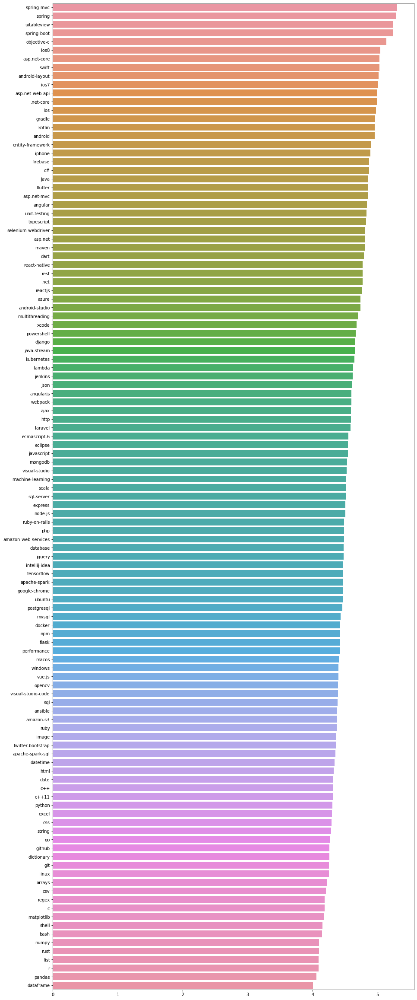

In [146]:
fig, ax = plt.subplots(figsize=(15,42))
ax= sns.barplot(y=mean_word_length.index,x=mean_word_length,orient='h')
plt.show()

In [151]:
for i in frequency_by_tag.keys():
    frequency_by_tag[i]=pd.Series(frequency_by_tag[i])


In [152]:
for i in frequency_by_tag.keys():
    frequency_by_tag[i]=frequency_by_tag[i][frequency_by_tag[i]>50]
    for j in frequency_by_tag[i].keys():
        try:
            int(j)
        except:
            None
        else:
            print('deleting',str(j),'in',i)
            del frequency_by_tag[i][j]
        if len(j)==1 and j !="c" and j!='r':
            print('deleting',str(j),'in',i)
            try:        
                del frequency_by_tag[i][j]
            except:
                print('error, not found',j,'in',i)

deleting x in python
deleting t in python
deleting a in python
deleting i in python
deleting s in python
deleting m in python
deleting g in python
deleting y in python
deleting p in python
deleting f in python
deleting e in python
deleting l in python
deleting o in python
deleting n in python
deleting w in python
deleting d in python
deleting b in python
deleting v in python
deleting k in python
deleting z in python
deleting j in python
deleting u in python
deleting h in python
deleting q in python
deleting i in javascript
deleting a in javascript
deleting s in javascript
deleting t in javascript
deleting m in javascript
deleting d in javascript
deleting x in javascript
deleting b in javascript
deleting e in javascript
deleting g in javascript
deleting h in javascript
deleting v in javascript
deleting p in javascript
deleting z in javascript
deleting k in javascript
deleting o in javascript
deleting n in javascript
deleting y in javascript
deleting j in javascript
deleting w in javascr

deleting e in amazon-web-services
deleting b in amazon-web-services
deleting f in amazon-web-services
deleting g in amazon-web-services
deleting x in amazon-web-services
deleting n in amazon-web-services
deleting i in windows
deleting a in windows
deleting g in windows
deleting b in windows
deleting t in windows
deleting d in windows
deleting m in windows
deleting f in windows
deleting x in windows
deleting v in windows
deleting s in windows
deleting e in windows
deleting i in postgresql
deleting x in postgresql
deleting a in postgresql
deleting s in postgresql
deleting t in postgresql
deleting d in postgresql
deleting m in postgresql
deleting e in postgresql
deleting u in postgresql
deleting f in postgresql
deleting b in postgresql
deleting n in postgresql
deleting p in postgresql
deleting i in macos
deleting a in macos
deleting p in macos
deleting m in macos
deleting f in macos
deleting s in macos
deleting g in macos
deleting t in macos
deleting x in macos
deleting e in macos
deletin

deleting t in ansible
deleting u in ansible
deleting i in apache-spark-sql
deleting a in apache-spark-sql
deleting e in apache-spark-sql
deleting t in apache-spark-sql
deleting s in apache-spark-sql
deleting m in apache-spark-sql
deleting d in apache-spark-sql
deleting b in apache-spark-sql
deleting f in apache-spark-sql
deleting l in apache-spark-sql
deleting n in apache-spark-sql
deleting x in apache-spark-sql
deleting i in image
deleting a in image
deleting t in image
deleting e in image
deleting s in image
deleting d in image
deleting m in image
deleting x in image
deleting y in image
deleting p in image
deleting i in spring-mvc
deleting a in spring-mvc
deleting m in spring-mvc
deleting s in spring-mvc
deleting t in spring-mvc
deleting i in ajax
deleting a in ajax
deleting s in ajax
deleting m in ajax
deleting t in ajax
deleting e in ajax
deleting d in ajax
deleting i in kubernetes
deleting a in kubernetes
deleting s in kubernetes
deleting t in kubernetes
deleting m in kubernetes
d

In [153]:
frequency_by_tag

{'python': this         14082
 must           398
 be            5561
 simple         873
 but           8669
              ...  
 tqdm            60
 torch          141
 pipenv          58
 dataclass       51
 pytorch         73
 Length: 2108, dtype: int64,
 'javascript': need          2061
 to           32656
 change        1278
 the          44239
 src           1669
              ...  
 vuex            56
 firestore       67
 puppeteer       71
 mat             90
 useeffect       79
 Length: 1872, dtype: int64,
 'java': recently     132
 noticed       72
 that        6588
 string      5972
 regex        111
             ... 
 starter       75
 swagger       52
 entryset      65
 docker        56
 kotlin       197
 Length: 1533, dtype: int64,
 'android': have                5370
 project             2344
 that                6069
 uses                 395
 few                  190
                     ... 
 viewmodel            193
 constraintlayout     105
 livedata             12

On regarde les tags présents sur plus de 5 années

amazon-web-services 



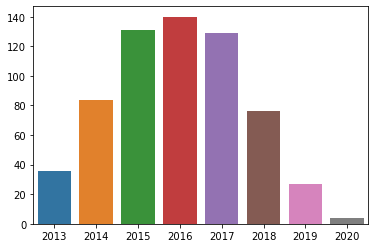

-------------------- 



android 



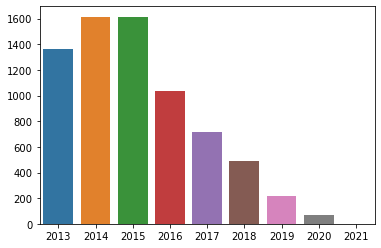

-------------------- 



angular 



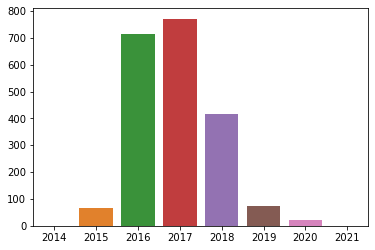

-------------------- 



angularjs 



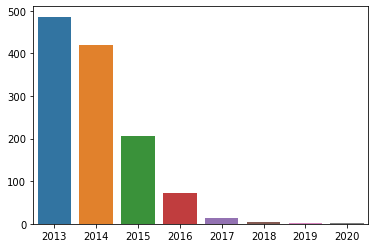

-------------------- 



c 



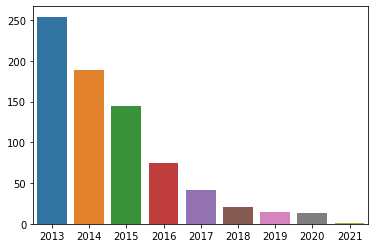

-------------------- 



c# 



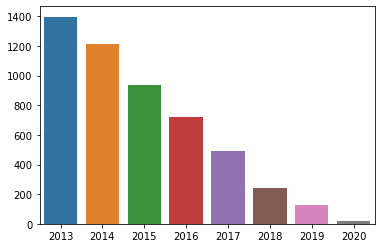

-------------------- 



c++ 



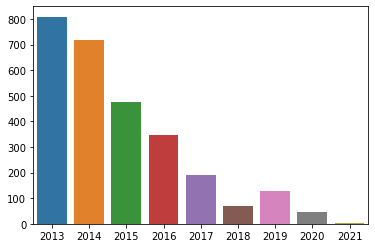

-------------------- 



css 



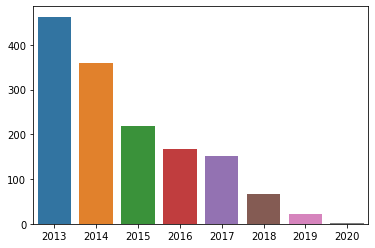

-------------------- 



docker 



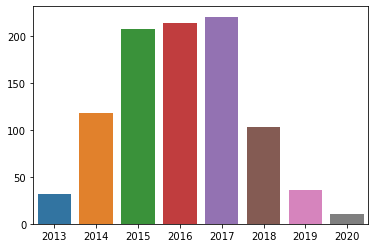

-------------------- 



git 



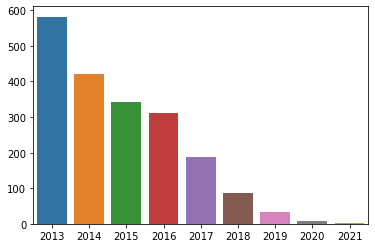

-------------------- 



go 



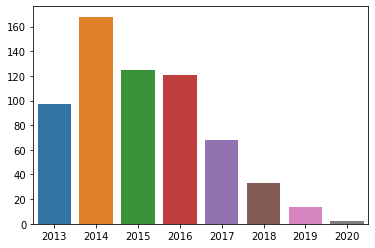

-------------------- 



html 



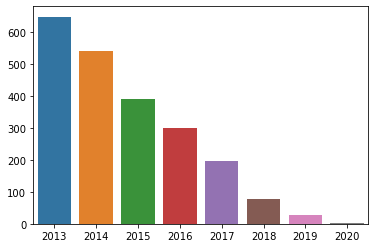

-------------------- 



ios 



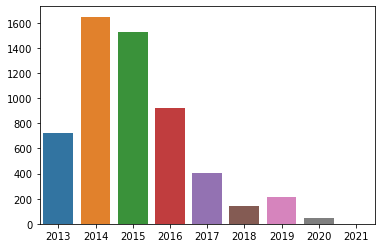

-------------------- 



java 



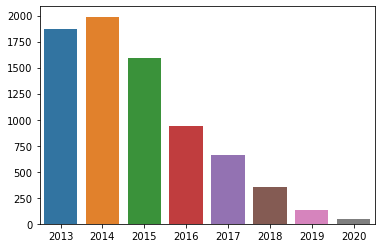

-------------------- 



javascript 



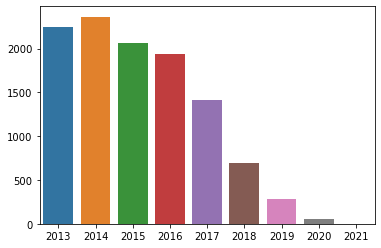

-------------------- 



jquery 



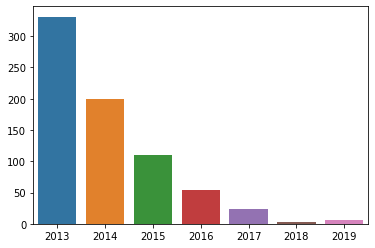

-------------------- 



linux 



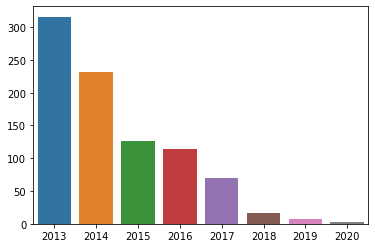

-------------------- 



mysql 



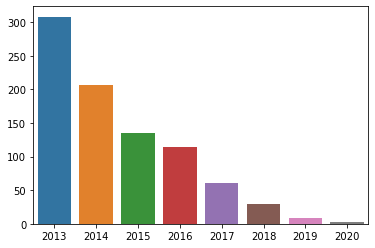

-------------------- 



node.js 



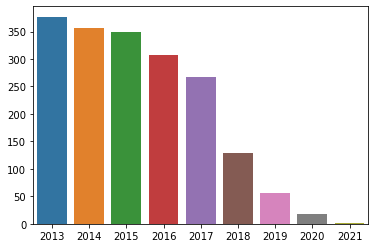

-------------------- 



php 



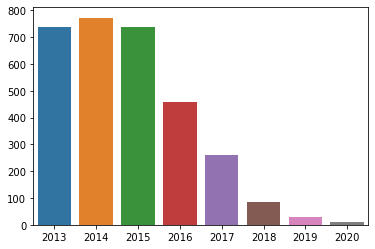

-------------------- 



python 



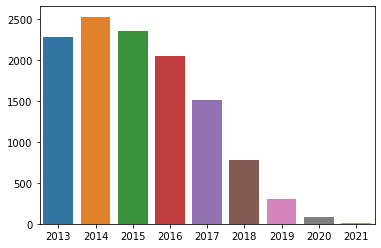

-------------------- 



r 



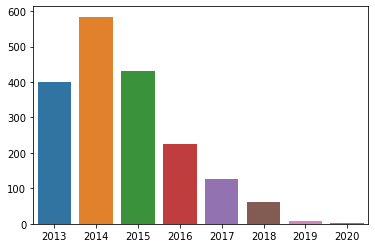

-------------------- 



reactjs 



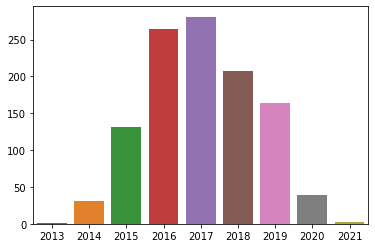

-------------------- 



ruby-on-rails 



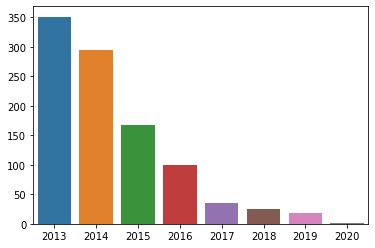

-------------------- 



scala 



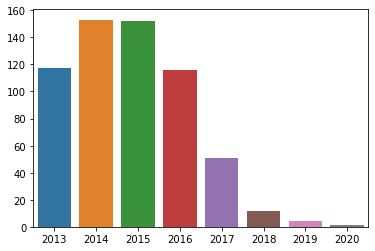

-------------------- 



sql 



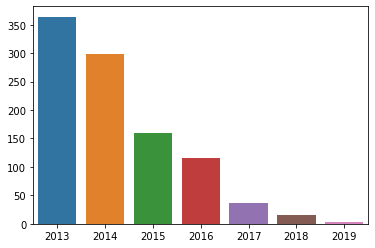

-------------------- 



swift 



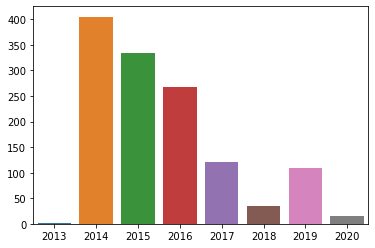

-------------------- 



typescript 



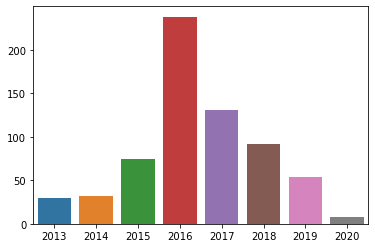

-------------------- 





In [154]:
for i in query.groupby('Tag_list0'):
    if query[query.Tag_list0 == i[0]].shape[0]>600:
        if i[1].CreationDate.apply(pd.to_datetime).dt.year.value_counts().shape[0]>=5:
            print(i[0],'\n')
            plt.figure()
            sns.barplot(x=i[1].CreationDate.apply(pd.to_datetime).dt.year.value_counts().index,y=i[1]
                        .CreationDate.apply(pd.to_datetime).dt.year.value_counts().values)
            plt.show()
            plt.close
            print(10*'--',3*'\n')

## Suppression des tags les moins courants.

En utilisant les observation que l'on a fait on va épurer notre dataset en ne conservant que :
<ul>
    <li>Les tags les plus fréquents
    <li>Les tags présents sur plusieurs années
</ul>        
On va aussi remplacer certains tags par des tags synonymes.

### Tags synonymes.

Commençons par remplacer les tag par leur synonymes.

In [155]:
for n in np.arange(5):
    print(n)
    for i in query.columns:
        if 'Tag_l' in i:
            print(i)
            query[i].replace(map_dict,inplace=True)
            query[i].replace(map_dict2,inplace=True)

0
Tag_list0
Tag_list1
Tag_list2
Tag_list3
Tag_list4
1
Tag_list0
Tag_list1
Tag_list2
Tag_list3
Tag_list4
2
Tag_list0
Tag_list1
Tag_list2
Tag_list3
Tag_list4
3
Tag_list0
Tag_list1
Tag_list2
Tag_list3
Tag_list4
4
Tag_list0
Tag_list1
Tag_list2
Tag_list3
Tag_list4


In [156]:
query

,AcceptedAnswerId,AnswerCount,Body,ClosedDate,CommentCount,CreationDate,FavoriteCount,Id,LastActivityDate,LastEditDate,...,Body_text,Body_words,Title_words,Tag_list0,Tag_list1,Tag_list2,Tag_list3,Tag_list4,Body_Bigrams,Body_Trigrams
0,16746682.0,5,<p>I have a project that uses a few other libr...,NaN,0,2013-05-25 04:56:51,7,16746558,2014-01-05 13:39:10,NaN,...,I have a project that uses a few other library...,"[i, have, a, project, that, uses, a, few, othe...","[android, gradle, build, and, the, support, li...",android,build,gradle,NaN,NaN,"[(i, have), (have, a), (a, project), (project,...","[(i, have, a), (have, a, project), (a, project..."
1,16756180.0,4,"<p>This must be simple, but as an only occasio...",NaN,3,2013-05-26 04:12:23,4,16756174,2021-02-07 17:10:31,NaN,...,This must be simple but as an only occasional...,"[this, must, be, simple, but, as, an, only, oc...","[python, one, line, function, definition]",python,NaN,NaN,NaN,NaN,"[(this, must), (must, be), (be, simple), (simp...","[(this, must, be), (must, be, simple), (be, si..."
4,16758128.0,6,"<p>In the example below, <code>#logo</code> is...",2014-09-28 21:14:43,4,2013-05-26 09:57:00,40,16758102,2014-07-30 14:11:00,2013-10-21 15:53:43,...,In the example below logo is positioned abso...,"[in, the, example, below, logo, is, positioned...","[how, do, i, horizontally, center, an, absolut...",html,css,NaN,NaN,NaN,"[(in, the), (the, example), (example, below), ...","[(in, the, example), (the, example, below), (e..."
5,16758439.0,6,<p>There are many types of graphic images in t...,2020-09-17 19:17:21,2,2013-05-26 09:57:33,15,16758105,2020-09-07 14:25:39,2019-03-26 04:03:14,...,There are many types of graphic images in this...,"[there, are, many, types, of, graphic, images,...","[list, all, graphic, image, files, with, find]",linux,graphics,find,NaN,NaN,"[(there, are), (are, many), (many, types), (ty...","[(there, are, many), (are, many, types), (many..."
7,16765884.0,2,<p>I am having some problems with create with ...,NaN,0,2013-05-27 03:18:47,3,16765877,2019-09-02 07:07:54,2019-01-24 20:06:21,...,I am having some problems with create with JSO...,"[i, am, having, some, problems, with, create, ...","[additional, text, encountered, after, finishe...",c#,json,json.net,NaN,NaN,"[(i, am), (am, having), (having, some), (some,...","[(i, am, having), (am, having, some), (having,..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
167046,66185853.0,4,<p>In Dagger Hilt View Model 1.0.0-alpha01</p>...,NaN,0,2021-02-13 13:49:18,1,66185820,2021-04-02 16:42:53,NaN,...,In Dagger Hilt View Model alpha im...,"[in, dagger, hilt, view, model, alpha, impleme...","[dagger, hilt, assisted, and, viewmodelinject,...",android,android-viewmodel,dagger-hilt,NaN,NaN,"[(in, dagger), (dagger, hilt), (hilt, view), (...","[(in, dagger, hilt), (dagger, hilt, view), (hi..."
167049,66763874.0,3,<p>When creating a react app via <code>npx cre...,NaN,0,2021-03-05 08:39:15,3,66489286,2021-03-30 05:12:30,2021-03-05 09:21:30,...,When creating a react app via npx create react...,"[when, creating, a, react, app, via, npx, crea...","[sharedarraybuffer, will, require, cross, orig...",reactjs,google-chrome,NaN,NaN,NaN,"[(when, creating), (creating, a), (a, react), ...","[(when, creating, a), (creating, a, react), (a..."
167052,66087132.0,7,<p>I am facing a weird error when I installed ...,2021-03-01 19:55:37,1,2021-02-06 21:58:06,8,66082397,2021-03-01 03:09:41,2021-03-01 03:09:41,...,I am facing a weird error when I installed boo...,"[i, am, facing, a, weird, error, when, i, inst...","[typeerror, this, getoptions, is, not, a, func...",vue.js,webpack,sass-loader,NaN,NaN,"[(i, am), (am, facing), (facing, a), (a, weird...","[(i, am, facing), (am, facing, a), (facing, a,..."
167053,66202295.0,6,<p>Has Ant Design project been deleted?\nThey ...,2021-02-15 07:05:59,12,2021-02-14 17:00:49,6,66197823,2021-02-15 05:45:20,NaN,...,Has Ant Design project been deleted They were...,"[has, ant

### Tags les plus fréquents.

<AxesSubplot:>

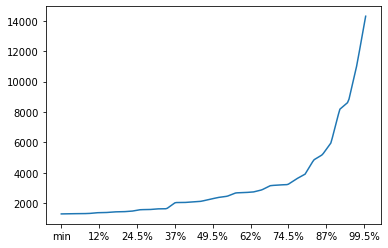

In [157]:
tags_frequency[tags_frequency>tags_frequency.sum()/200].describe(percentiles=np.arange(200)/200)[3:].plot()

In [158]:
tags_frequency[tags_frequency>tags_frequency.sum()/1000]

python             14292.0
javascript         11119.0
java                8657.0
android             8170.0
ios                 5974.0
                    ...   
nginx                262.0
material-design      259.0
rxjs                 258.0
flexbox              257.0
google-maps          255.0
Length: 166, dtype: float64

In [159]:
tags_frequency.sum()/1000

254.995

On va supprimer les entrées qui n'ont pas au moins un de leurs tags avec plus de 250 occurences.

In [160]:
tag_set=set(tags_frequency[tags_frequency>250].index)
new_index=[]
for i in query.index:
    if set(query.loc[i,[j for j in query.columns if 'Tag_l' in j]])&tag_set:
        new_index.append(i)

In [161]:
query=query.loc[new_index]

In [162]:
query

,AcceptedAnswerId,AnswerCount,Body,ClosedDate,CommentCount,CreationDate,FavoriteCount,Id,LastActivityDate,LastEditDate,...,Body_text,Body_words,Title_words,Tag_list0,Tag_list1,Tag_list2,Tag_list3,Tag_list4,Body_Bigrams,Body_Trigrams
0,16746682.0,5,<p>I have a project that uses a few other libr...,NaN,0,2013-05-25 04:56:51,7,16746558,2014-01-05 13:39:10,NaN,...,I have a project that uses a few other library...,"[i, have, a, project, that, uses, a, few, othe...","[android, gradle, build, and, the, support, li...",android,build,gradle,NaN,NaN,"[(i, have), (have, a), (a, project), (project,...","[(i, have, a), (have, a, project), (a, project..."
1,16756180.0,4,"<p>This must be simple, but as an only occasio...",NaN,3,2013-05-26 04:12:23,4,16756174,2021-02-07 17:10:31,NaN,...,This must be simple but as an only occasional...,"[this, must, be, simple, but, as, an, only, oc...","[python, one, line, function, definition]",python,NaN,NaN,NaN,NaN,"[(this, must), (must, be), (be, simple), (simp...","[(this, must, be), (must, be, simple), (be, si..."
4,16758128.0,6,"<p>In the example below, <code>#logo</code> is...",2014-09-28 21:14:43,4,2013-05-26 09:57:00,40,16758102,2014-07-30 14:11:00,2013-10-21 15:53:43,...,In the example below logo is positioned abso...,"[in, the, example, below, logo, is, positioned...","[how, do, i, horizontally, center, an, absolut...",html,css,NaN,NaN,NaN,"[(in, the), (the, example), (example, below), ...","[(in, the, example), (the, example, below), (e..."
5,16758439.0,6,<p>There are many types of graphic images in t...,2020-09-17 19:17:21,2,2013-05-26 09:57:33,15,16758105,2020-09-07 14:25:39,2019-03-26 04:03:14,...,There are many types of graphic images in this...,"[there, are, many, types, of, graphic, images,...","[list, all, graphic, image, files, with, find]",linux,graphics,find,NaN,NaN,"[(there, are), (are, many), (many, types), (ty...","[(there, are, many), (are, many, types), (many..."
7,16765884.0,2,<p>I am having some problems with create with ...,NaN,0,2013-05-27 03:18:47,3,16765877,2019-09-02 07:07:54,2019-01-24 20:06:21,...,I am having some problems with create with JSO...,"[i, am, having, some, problems, with, create, ...","[additional, text, encountered, after, finishe...",c#,json,json.net,NaN,NaN,"[(i, am), (am, having), (having, some), (some,...","[(i, am, having), (am, having, some), (having,..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
167046,66185853.0,4,<p>In Dagger Hilt View Model 1.0.0-alpha01</p>...,NaN,0,2021-02-13 13:49:18,1,66185820,2021-04-02 16:42:53,NaN,...,In Dagger Hilt View Model alpha im...,"[in, dagger, hilt, view, model, alpha, impleme...","[dagger, hilt, assisted, and, viewmodelinject,...",android,android-viewmodel,dagger-hilt,NaN,NaN,"[(in, dagger), (dagger, hilt), (hilt, view), (...","[(in, dagger, hilt), (dagger, hilt, view), (hi..."
167049,66763874.0,3,<p>When creating a react app via <code>npx cre...,NaN,0,2021-03-05 08:39:15,3,66489286,2021-03-30 05:12:30,2021-03-05 09:21:30,...,When creating a react app via npx create react...,"[when, creating, a, react, app, via, npx, crea...","[sharedarraybuffer, will, require, cross, orig...",reactjs,google-chrome,NaN,NaN,NaN,"[(when, creating), (creating, a), (a, react), ...","[(when, creating, a), (creating, a, react), (a..."
167052,66087132.0,7,<p>I am facing a weird error when I installed ...,2021-03-01 19:55:37,1,2021-02-06 21:58:06,8,66082397,2021-03-01 03:09:41,2021-03-01 03:09:41,...,I am facing a weird error when I installed boo...,"[i, am, facing, a, weird, error, when, i, inst...","[typeerror, this, getoptions, is, not, a, func...",vue.js,webpack,sass-loader,NaN,NaN,"[(i, am), (am, facing), (facing, a), (a, weird...","[(i, am, facing), (am, facing, a), (facing, a,..."
167053,66202295.0,6,<p>Has Ant Design project been deleted?\nThey ...,2021-02-15 07:05:59,12,2021-02-14 17:00:49,6,66197823,2021-02-15 05:45:20,NaN,...,Has Ant Design project been deleted They were...,"[has, ant

### Tags présents sur plusieurs années.

In [163]:
tag_set=[]
for j in query.columns:
    if 'Tag_l' in j:
        for i in query.groupby(j):
            if i[1].CreationDate.apply(pd.to_datetime).dt.year.value_counts().shape[0]>=3:
                tag_set.append(i[0])

In [164]:
len(set(tag_set))

3462

In [165]:
tag_set=set(tag_set)

In [166]:
new_index=[]
for i in query.index:
    if set(query.loc[i,[j for j in query.columns if 'Tag_l' in j]])&tag_set:
        new_index.append(i)

In [167]:
query=query.loc[new_index]

In [168]:
query

,AcceptedAnswerId,AnswerCount,Body,ClosedDate,CommentCount,CreationDate,FavoriteCount,Id,LastActivityDate,LastEditDate,...,Body_text,Body_words,Title_words,Tag_list0,Tag_list1,Tag_list2,Tag_list3,Tag_list4,Body_Bigrams,Body_Trigrams
0,16746682.0,5,<p>I have a project that uses a few other libr...,NaN,0,2013-05-25 04:56:51,7,16746558,2014-01-05 13:39:10,NaN,...,I have a project that uses a few other library...,"[i, have, a, project, that, uses, a, few, othe...","[android, gradle, build, and, the, support, li...",android,build,gradle,NaN,NaN,"[(i, have), (have, a), (a, project), (project,...","[(i, have, a), (have, a, project), (a, project..."
1,16756180.0,4,"<p>This must be simple, but as an only occasio...",NaN,3,2013-05-26 04:12:23,4,16756174,2021-02-07 17:10:31,NaN,...,This must be simple but as an only occasional...,"[this, must, be, simple, but, as, an, only, oc...","[python, one, line, function, definition]",python,NaN,NaN,NaN,NaN,"[(this, must), (must, be), (be, simple), (simp...","[(this, must, be), (must, be, simple), (be, si..."
4,16758128.0,6,"<p>In the example below, <code>#logo</code> is...",2014-09-28 21:14:43,4,2013-05-26 09:57:00,40,16758102,2014-07-30 14:11:00,2013-10-21 15:53:43,...,In the example below logo is positioned abso...,"[in, the, example, below, logo, is, positioned...","[how, do, i, horizontally, center, an, absolut...",html,css,NaN,NaN,NaN,"[(in, the), (the, example), (example, below), ...","[(in, the, example), (the, example, below), (e..."
5,16758439.0,6,<p>There are many types of graphic images in t...,2020-09-17 19:17:21,2,2013-05-26 09:57:33,15,16758105,2020-09-07 14:25:39,2019-03-26 04:03:14,...,There are many types of graphic images in this...,"[there, are, many, types, of, graphic, images,...","[list, all, graphic, image, files, with, find]",linux,graphics,find,NaN,NaN,"[(there, are), (are, many), (many, types), (ty...","[(there, are, many), (are, many, types), (many..."
7,16765884.0,2,<p>I am having some problems with create with ...,NaN,0,2013-05-27 03:18:47,3,16765877,2019-09-02 07:07:54,2019-01-24 20:06:21,...,I am having some problems with create with JSO...,"[i, am, having, some, problems, with, create, ...","[additional, text, encountered, after, finishe...",c#,json,json.net,NaN,NaN,"[(i, am), (am, having), (having, some), (some,...","[(i, am, having), (am, having, some), (having,..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
167046,66185853.0,4,<p>In Dagger Hilt View Model 1.0.0-alpha01</p>...,NaN,0,2021-02-13 13:49:18,1,66185820,2021-04-02 16:42:53,NaN,...,In Dagger Hilt View Model alpha im...,"[in, dagger, hilt, view, model, alpha, impleme...","[dagger, hilt, assisted, and, viewmodelinject,...",android,android-viewmodel,dagger-hilt,NaN,NaN,"[(in, dagger), (dagger, hilt), (hilt, view), (...","[(in, dagger, hilt), (dagger, hilt, view), (hi..."
167049,66763874.0,3,<p>When creating a react app via <code>npx cre...,NaN,0,2021-03-05 08:39:15,3,66489286,2021-03-30 05:12:30,2021-03-05 09:21:30,...,When creating a react app via npx create react...,"[when, creating, a, react, app, via, npx, crea...","[sharedarraybuffer, will, require, cross, orig...",reactjs,google-chrome,NaN,NaN,NaN,"[(when, creating), (creating, a), (a, react), ...","[(when, creating, a), (creating, a, react), (a..."
167052,66087132.0,7,<p>I am facing a weird error when I installed ...,2021-03-01 19:55:37,1,2021-02-06 21:58:06,8,66082397,2021-03-01 03:09:41,2021-03-01 03:09:41,...,I am facing a weird error when I installed boo...,"[i, am, facing, a, weird, error, when, i, inst...","[typeerror, this, getoptions, is, not, a, func...",vue.js,webpack,sass-loader,NaN,NaN,"[(i, am), (am, facing), (facing, a), (a, weird...","[(i, am, facing), (am, facing, a), (facing, a,..."
167053,66202295.0,6,<p>Has Ant Design project been deleted?\nThey ...,2021-02-15 07:05:59,12,2021-02-14 17:00:49,6,66197823,2021-02-15 05:45:20,NaN,...,Has Ant Design project been deleted They were...,"[has, ant

## Selection de colonnes et ajout de nouvelles features.

On va maintenant ajouter de nouvelles feature en prévision d'un apprentissage supervisé.

Rappelons les colonnes du jeu de données.

In [169]:
query.columns

Index(['AcceptedAnswerId', 'AnswerCount', 'Body', 'ClosedDate', 'CommentCount',
       'CreationDate', 'FavoriteCount', 'Id', 'LastActivityDate',
       'LastEditDate', 'LastEditorDisplayName', 'LastEditorUserId',
       'OwnerUserId', 'Score', 'Tags', 'Title', 'ViewCount', 'Body_text',
       'Body_words', 'Title_words', 'Tag_list0', 'Tag_list1', 'Tag_list2',
       'Tag_list3', 'Tag_list4', 'Body_Bigrams', 'Body_Trigrams'],
      dtype='object')

In [170]:
query['Body_length']=query.Body_text.apply(len)

In [171]:
query['Body_words_count']=query.Body_words.apply(len)

In [172]:
query['Body_words_tags_present']=[len(set(query.Body_words.loc[j])&set(query.loc[j][[c for c in query.columns if 'Tag_l' in c]].values))for j in query.index]

On fait de même avec les titres.

In [173]:
query['Title_length']=query.Title.apply(len)

query['Title_words_count']=query.Title_words.apply(len)

In [174]:
query['Title_words_tags_present']=[len(set(query.Title_words.loc[j])&set(query.loc[j][[c for c in query.columns if 'Tag_l' in c]].values))for j in query.index]

On exporte maintenant notre jeu de données au format csv pour le réutiliser dans le notebook de test

In [175]:
pd.Series(tag_similarity_df).apply(str).to_csv('corpus_by_tag.csv',)

query.columns

query_to_export= query[['Id','CreationDate', 'Body',
                        'Title', 'Body_text',
                        'Tag_list0', 'Tag_list1', 'Tag_list2', 'Tag_list3',
                       'Tag_list4','Body_length', 'Body_words_count', 'Body_words_tags_present',
       'Title_length', 'Title_words_count', 'Title_words_tags_present' ]]
query_to_export.to_csv("exported_query_df.csv",index=False)